In [1]:
import os
# os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
# os.environ["CUDA_VISIBLE_DEVICES"]="6"
import sys
os.chdir('/home/yangk/dreidenbach/rl/molecule')
sys.path.insert(0, '/home/yangk/dreidenbach/rl/molecule/code')
sys.path.insert(0, '/home/yangk/dreidenbach/rl/molecule/code/hgraph2graph')
sys.path.insert(0, '/home/yangk/dreidenbach/rl/molecule/code/MolecularTransformer')
import pickle
%load_ext autoreload
%autoreload 2

In [2]:
from utils.latent_model import *
from utils.molecular_transformer import *

In [188]:
latent_space = LatentSpaceModel()
dynamics = MolecularTransformer()

___Loading Latent Space___
HierVAE Model #Params: 7390K
continuing from checkpoint /home/yangk/dreidenbach/rl/molecule/code/hgraph2graph/ckpt/combo_V2/model.ckpt.55000.224.691


In [60]:
z, b_ = latent_space.encode(["NC(=O)c1ccccc1Nc1nc(Nc2ccc(Cl)cc2)ncc1Cl", "NC(=O)c1cCNNNNOcccc1Nc1nc(Nc2ccc(Cl)cc2)ncc1Cl"])
#, None == Chem.MolFromSmiles("CCcCOOON")

In [63]:
z.shape

torch.Size([1, 32])

In [154]:
from rdkit import Chem
import numpy as np
import torch
import matplotlib.pyplot as plt

def grab(log, key):
    results = []
    for k, v in log.items():
        results.append(v[key])
    return results

def reward_2_prop(x):
    return np.sqrt((x-1)/100)

In [3]:
# log_path = "/home/yangk/dreidenbach/rl/molecule/logs/log_discrete_buffer_test_V3_mean_cut_old.pkl"

In [4]:
with open("data/combo_buffer_JNK3_V3_discrete_map_inv.pkl", "rb") as f:
    action_map_inv = pickle.load(f)
with open("data/combo_buffer_JNK3_V3_discrete_map.pkl", "rb") as f:
    action_map = pickle.load(f)

In [25]:
from offlinerl.utils.net.tanhpolicy import CategoricalPolicy
from offlinerl.utils.net.common import MLP, Net




	    NEORL: NeuroEvolution Optimisation with Reinforcement Learning
			 ███╗   ██╗███████╗ ██████╗ ██████╗ ██╗     
			 ████╗  ██║██╔════╝██╔═══██╗██╔══██╗██║     
			 ██╔██╗ ██║█████╗  ██║   ██║██████╔╝██║     
			 ██║╚██╗██║██╔══╝  ██║   ██║██╔══██╗██║     
			 ██║ ╚████║███████╗╚██████╔╝██║  ██║███████╗
			 ╚═╝  ╚═══╝╚══════╝ ╚═════╝ ╚═╝  ╚═╝╚══════╝                                                
Copyright © 2021 Exelon Corporation (https://www.exeloncorp.com/) in collaboration with 
             MIT Nuclear Science and Engineering (https://web.mit.edu/nse/)
                             All Rights Reserved

                       



In [6]:
obs_shape, action_shape = 32, 4344 #3109 # 4344 actions in V3 maps
device = 'cuda:0' #'cpu'
epoch = 11
net_a = Net(layer_num=3, 
        state_shape=obs_shape,
        output_shape=action_shape,
        hidden_layer_size=6000)
actor = CategoricalPolicy(preprocess_net=net_a,
                        action_shape=action_shape,
                        hidden_layer_size=6000,
                        conditioned_sigma=False)
actor.load_state_dict(torch.load(f"/home/yangk/dreidenbach/rl/molecule/model_ckpt/policy_{save_name}_{epoch}.pt", map_location=torch.device(device)))
actor


CategoricalPolicy(
  (preprocess): Net(
    (model): Sequential(
      (0): Linear(in_features=32, out_features=6000, bias=True)
      (1): ReLU(inplace=True)
      (2): Linear(in_features=6000, out_features=6000, bias=True)
      (3): ReLU(inplace=True)
      (4): Linear(in_features=6000, out_features=6000, bias=True)
      (5): ReLU(inplace=True)
      (6): Linear(in_features=6000, out_features=6000, bias=True)
      (7): ReLU(inplace=True)
      (8): Linear(in_features=6000, out_features=4344, bias=True)
    )
  )
  (mu): Linear(in_features=6000, out_features=4344, bias=True)
)

In [7]:
qfunc = MLP(obs_shape, action_shape, 6000, 3, norm=None, hidden_activation='swish')
qfunc.load_state_dict(torch.load(f"/home/yangk/dreidenbach/rl/molecule/model_ckpt/q1_{save_name}_{epoch}.pt", map_location=torch.device(device)))
qfunc

MLP(
  (net): Sequential(
    (0): Linear(in_features=32, out_features=6000, bias=True)
    (1): Swish()
    (2): Linear(in_features=6000, out_features=6000, bias=True)
    (3): Swish()
    (4): Linear(in_features=6000, out_features=6000, bias=True)
    (5): Swish()
    (6): Linear(in_features=6000, out_features=4344, bias=True)
    (7): Identity()
  )
)

In [111]:
epoch = 1
with open(f"/home/yangk/dreidenbach/rl/molecule/data/model_buffer_map_{save_name}_{epoch}.pkl", "rb") as f:
    model_buffer_map = pickle.load(f)
len(model_buffer_map)

5

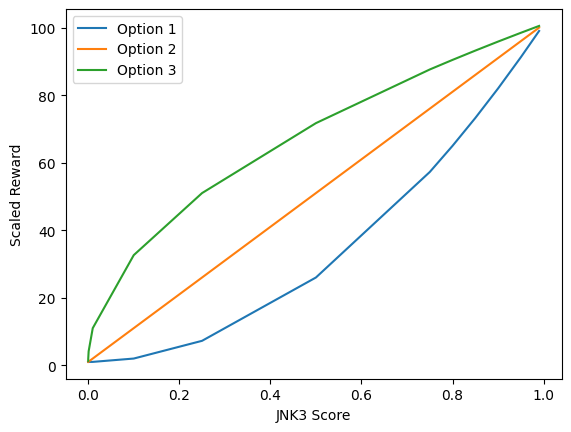

In [5]:
def scale_reward(x):
    return max(100*x*x+1, x)

scores = [0.00001, 0.0001, 0.001, 0.01, 0.1, 0.25, 0.5, 0.75, 0.8, 0.85, 0.9, 0.95, 0.99]
test = [scale_reward(x) for x in scores]
plt.plot(scores, test, label = "Option 1")
test = [max(100*x + 1, x) for x in scores]
plt.plot(scores, test, label = "Option 2")
test = [max(100*np.sqrt(x)+1, x) for x in scores]
plt.plot(scores, test, label = "Option 3")

# test = [max(100*np.sqrt(x)+1, x) if x <= 0.5 else max(100*x*x+70, x) for x in scores]
# plt.plot(scores, test, label = "Option 4")
plt.xlabel("JNK3 Score")
plt.ylabel("Scaled Reward")
plt.legend()
plt.show()

# Results

In [4]:
from rdkit import Chem
import numpy as np
import torch
import matplotlib.pyplot as plt
import pickle 
def grab(log, key):
    results = []
    for k, v in log.items():
        results.append(v[key])
    return results


save_name = "discrete_horizon_3_max_q_10_scale_3_one_sample_pretrain_policy"
save_name = "discrete_horizon_3_max_q_10_scale_1_one_sample_pretrain_policy_explore_2"
save_name = "discrete_horizon_3_max_q_10_scale_1_one_sample_no_pretrain_policy_explore_2"
save_name = "discrete_horizon_3_max_q_10_scale_2_one_sample_pretrain_policy_explore_2"
save_name = "discrete_horizon_3_max_q_10_scale_2_one_sample_no_pretrain_policy_explore_inject"
save_name = "discrete_horizon_3_max_q_10_scale_2_one_sample_no_pretrain_policy_explore_clean_buffer"

# save_name = "discrete_horizon_3_max_q_10_scale_2_one_sample_no_pretrain_policy_explore_DRD2"
save_name = "discrete_horizon_3_max_q_10_scale_2_explore_DRD2_discount_23_iter_clean_buffer_qupdate"
# save_name = "discrete_horizon_3_max_q_10_scale_2_explore_DRD2_discount_23_iter_clean_buffer_qupdate_entropy_decay"
save_name = "discrete_horizon_3_max_q_10_scale_2_explore_DRD2_discount_23_iter_clean_buffer_qupdate_no_done"
log_path = f"/home/yangk/dreidenbach/rl/molecule/logs/log_{save_name}.pkl"
with open(log_path, "rb") as f:
    log = pickle.load(f)
len(log), type(log)

(4, list)

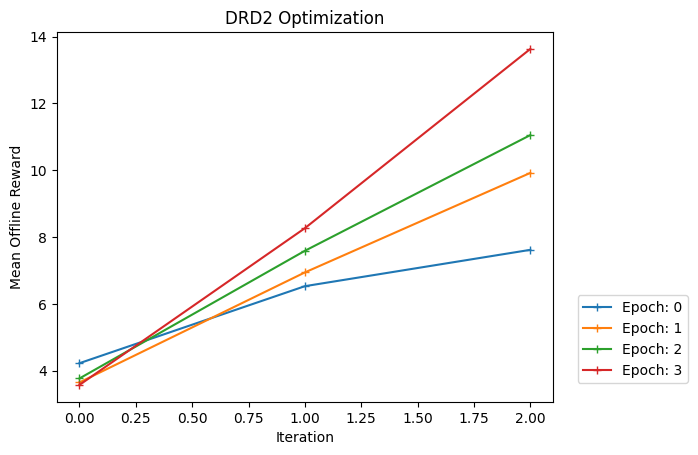

In [330]:
for idx, epoch in enumerate(log):
    actor_loss = grab(epoch, "total_mean_offline_reward")
    loss = [x[0] for x in actor_loss]
    if idx >= len(log) - 10:
        plt.plot(list(range(len(loss))), loss, "+-", label = f"Epoch: {idx}")
    else:
        plt.plot(list(range(len(loss))), loss)
plt.legend(loc = (1.05, 0.05))#, ncol=7)
plt.xlabel("Iteration")
plt.ylabel("Mean Offline Reward")
plt.title("DRD2 Optimization")
# plt.title("JNK3 Optimization")
plt.show()

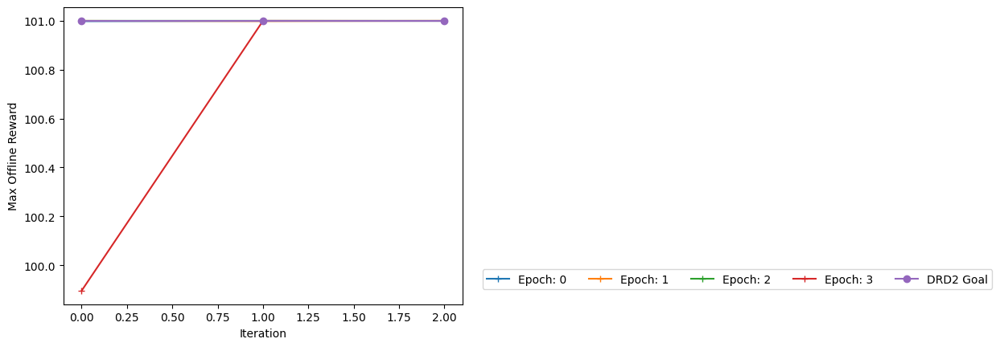

In [332]:
for idx, epoch in enumerate(log):
    actor_loss = grab(epoch, "total_max_offline_reward")
    loss = [x[0] for x in actor_loss]
    if idx >= len(log) - 10:
        plt.plot(list(range(len(loss))), loss, "+-", label = f"Epoch: {idx}")
    else:
        plt.plot(list(range(len(loss))), loss)
# plt.plot(list(range(len(loss))), [100*np.sqrt(0.99)+1]*len(loss), label = f"Goal")
plt.plot(list(range(len(loss))), [101]*len(loss), "o-", label = f"DRD2 Goal")
# plt.plot(list(range(len(loss))), [100*0.99*(0.99)+1]*len(loss), label = f"Goal")
plt.legend(loc = (1.05, 0.05), ncol=7)
plt.xlabel("Iteration")
plt.ylabel("Max Offline Reward")
plt.show()

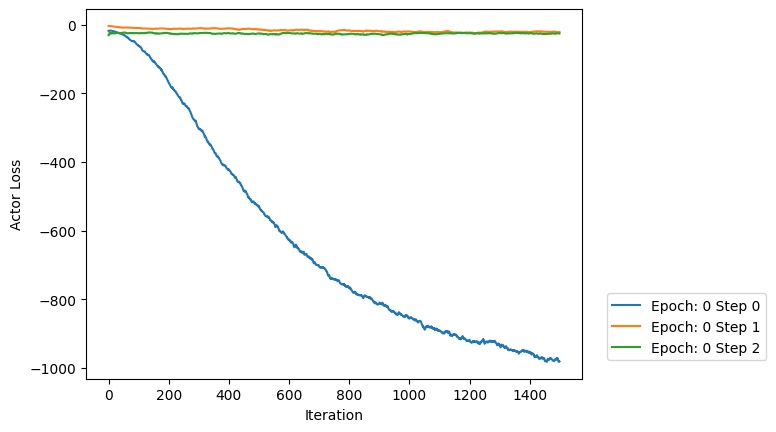

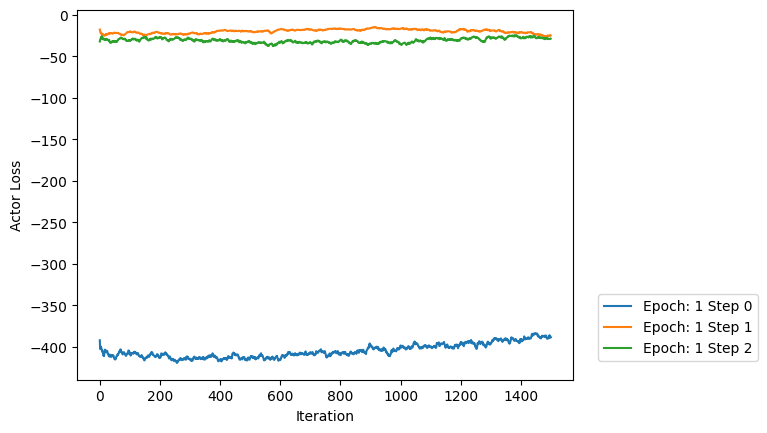

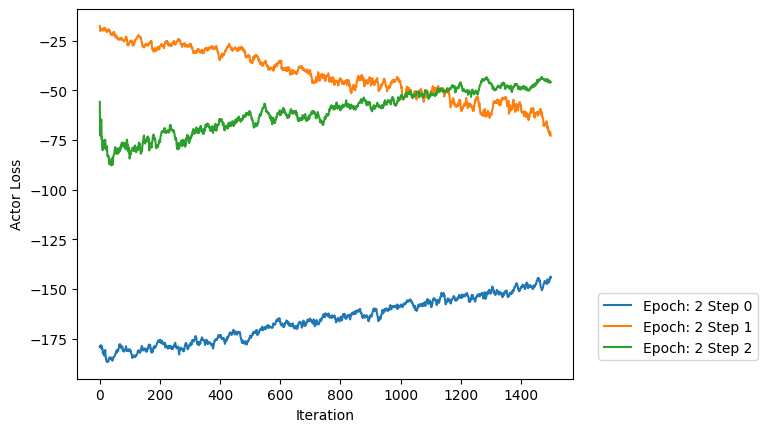

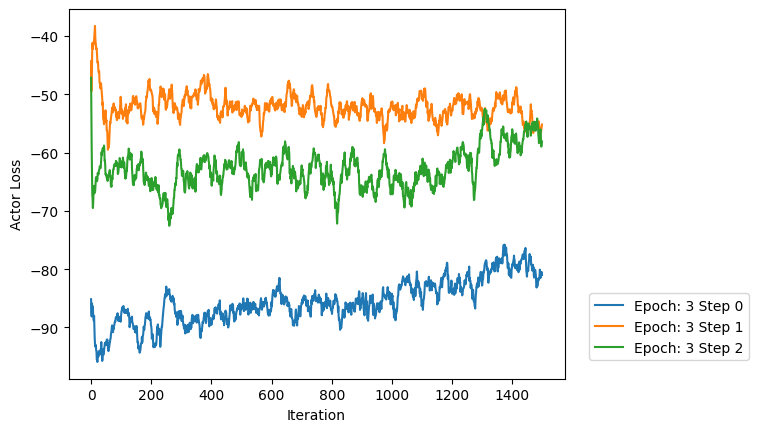

In [333]:
import pandas as pd
for idx, epoch in enumerate(log):
    actor_loss = grab(epoch, "actor_loss")
    for step, loss in enumerate(actor_loss):
        plt.plot(list(range(len(loss))), pd.Series.ewm(pd.Series(loss), span=25).mean(), label = f"Epoch: {idx} Step {step}")
    plt.legend(loc = (1.05, 0.05))
    plt.xlabel("Iteration")
    plt.ylabel("Actor Loss")
    plt.show()

9192.453125 1.9592742919921875
6029.1572265625 11.899864196777344
4050.82568359375 9.051678657531738


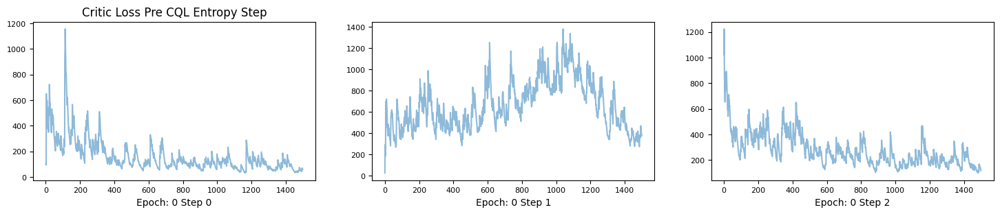

3325.56298828125 8.29415225982666
9712.1748046875 29.72745132446289
9016.7900390625 10.621223449707031


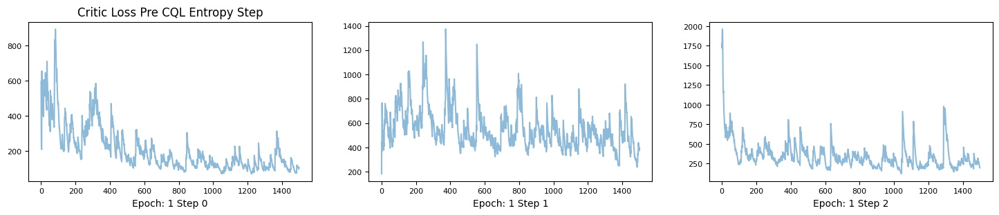

15445.7421875 4.053609371185303
15098.876953125 15.492977142333984
24695.55078125 15.514163970947266


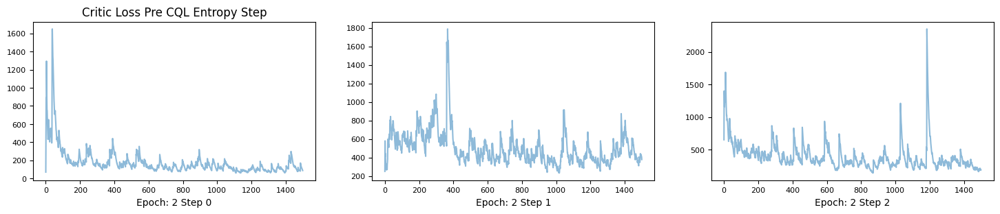

3621.628173828125 4.859248638153076
12446.4228515625 38.577552795410156
56298.70703125 15.631280899047852


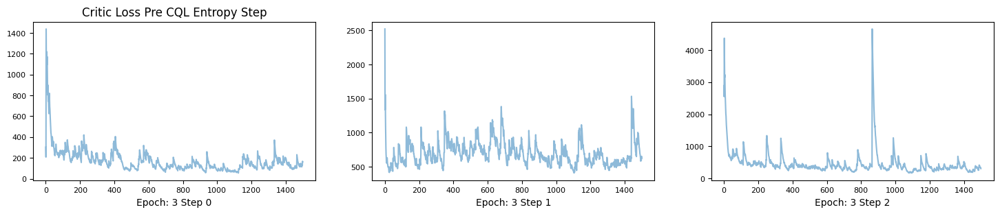

28235.87890625 22.5452880859375
34378.69921875 40.850101470947266
68981.2734375 17.580873489379883


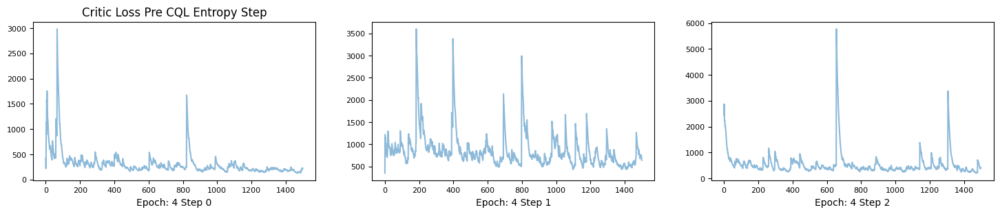

8953.9541015625 14.60376262664795
31368.05859375 60.05781173706055
118951.421875 23.181320190429688


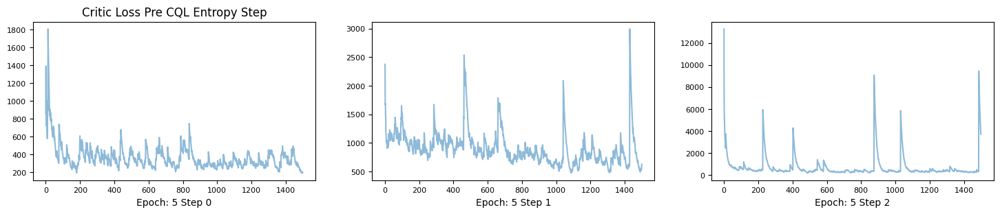

7642.388671875 28.347658157348633
31958.865234375 82.75111389160156
32410.21484375 22.986732482910156


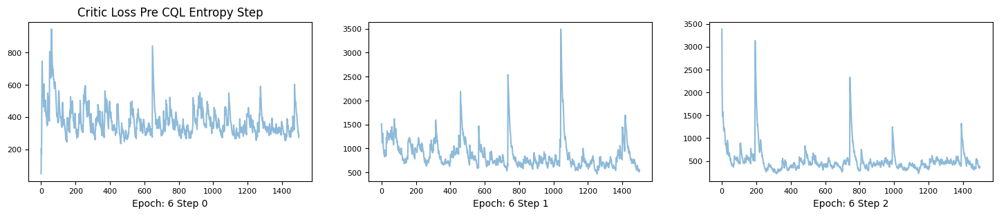

9470.080078125 22.063339233398438
245123.5 89.74317932128906
37601.1484375 28.47260284423828


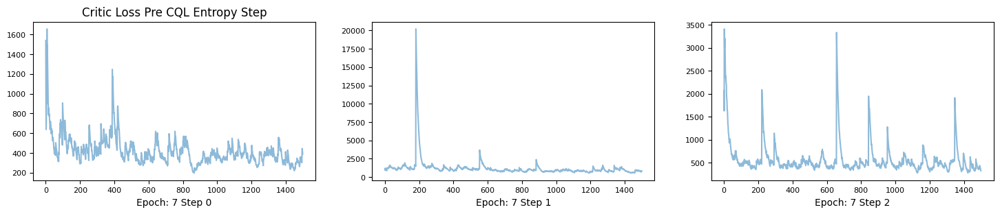

16796.236328125 24.454402923583984
74706.34375 57.415550231933594
45078.47265625 18.35917091369629


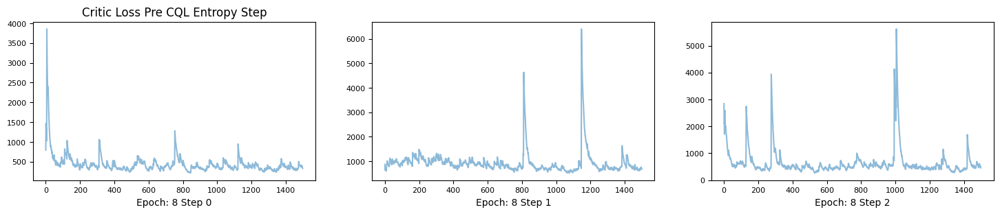

265672.15625 33.56755447387695
81211.6484375 90.29269409179688
42550.16015625 17.53191375732422


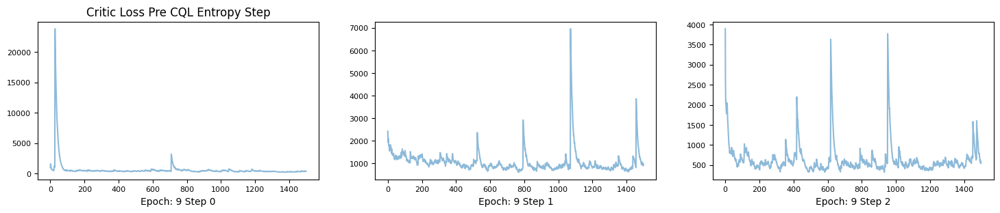

11226.6728515625 36.8287239074707
35613.35546875 79.40589904785156
195550.75 25.59115219116211


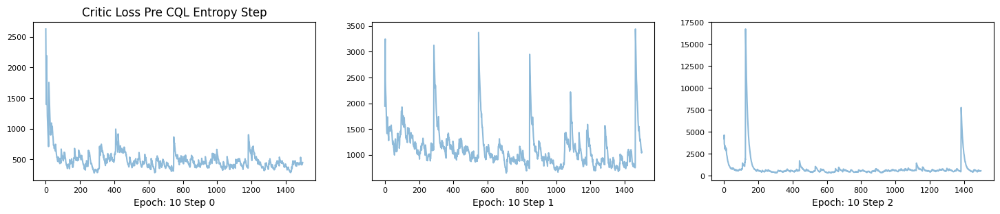

484489.75 26.332901000976562
141370.453125 113.80705261230469
48546.3828125 32.96137619018555


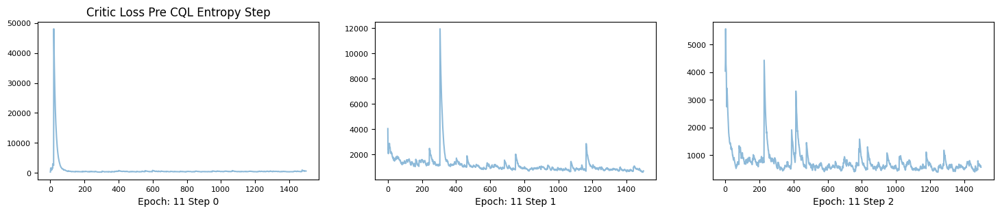

12936.658203125 37.261619567871094
222484.09375 107.37344360351562
70852.4765625 26.828147888183594


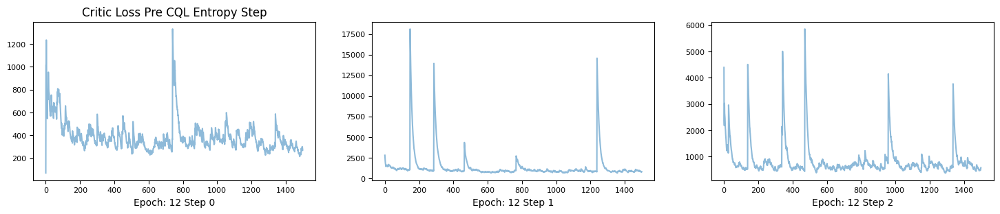

18750.47265625 28.6950626373291
37351.25 70.52490997314453
45697.98828125 36.498939514160156


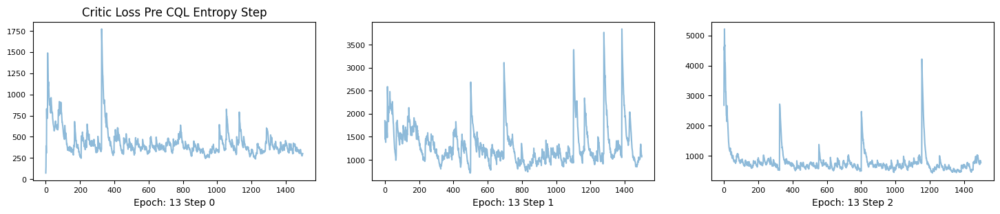

19370.935546875 39.73760986328125
24507.83203125 93.09080505371094
82342.9375 30.957275390625


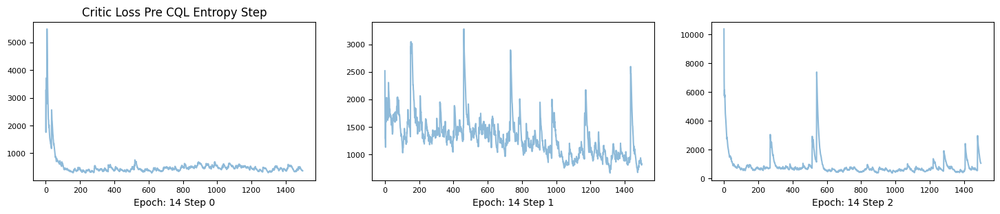

83482.9921875 27.19251823425293
46043.4921875 144.35621643066406
108335.984375 30.443500518798828


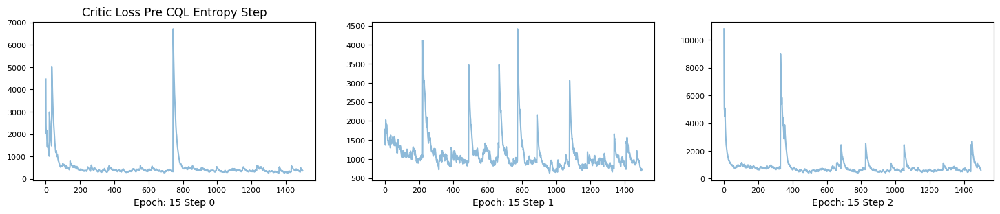

117084.3125 31.954608917236328
51596.3359375 128.54515075683594
71829.78125 23.919700622558594


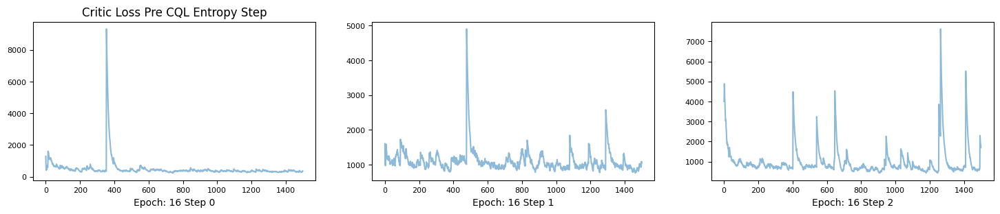

9299.6962890625 32.25135040283203
269554.6875 150.72817993164062
88989.90625 29.732582092285156


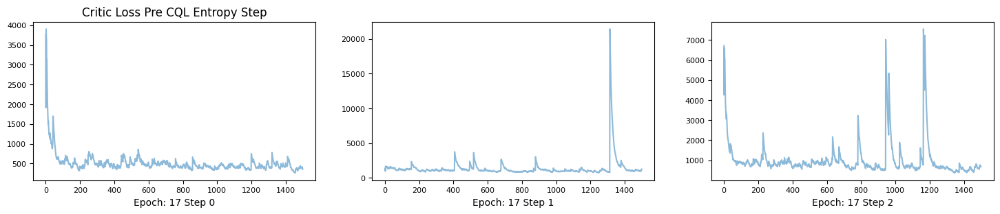

13257.8564453125 43.45988082885742
97324.59375 137.56402587890625
251533.40625 40.0146598815918


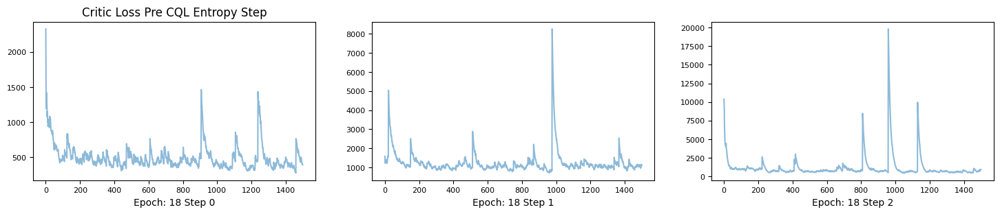

15894.376953125 34.93601989746094
223648.6875 104.28855895996094
1558261.375 40.75400161743164


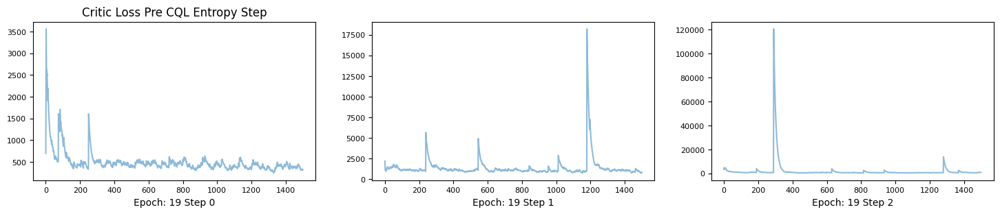

548687.0 38.469627380371094
60067.06640625 179.23663330078125
219452.484375 41.27897644042969


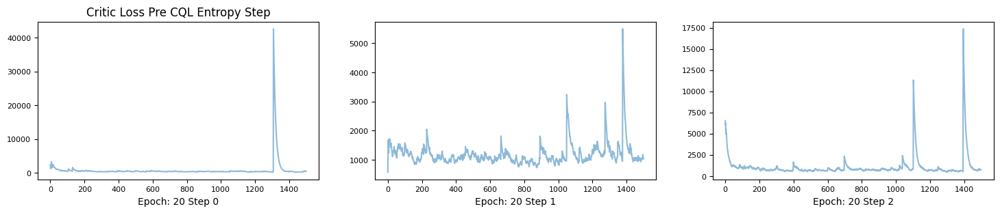

10915.27734375 48.15666198730469
114928.96875 127.4583740234375
696396.75 38.833675384521484


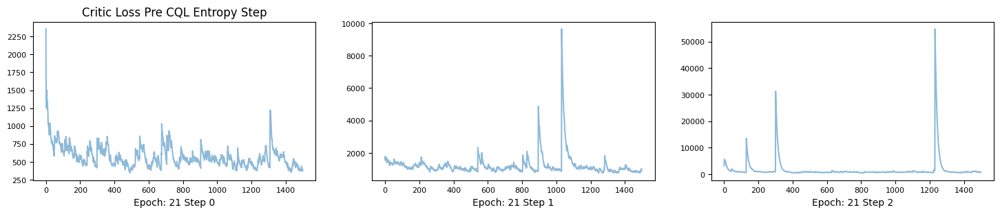

199367.71875 48.51039123535156
61157.078125 130.2886505126953
133501.65625 32.30430603027344


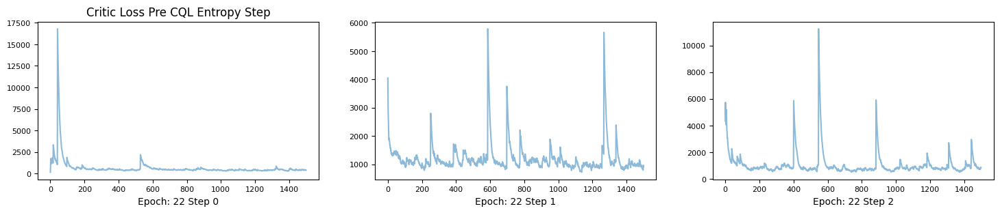

37937.03125 33.460811614990234
190100.84375 122.12284851074219
3093941.75 23.758474349975586


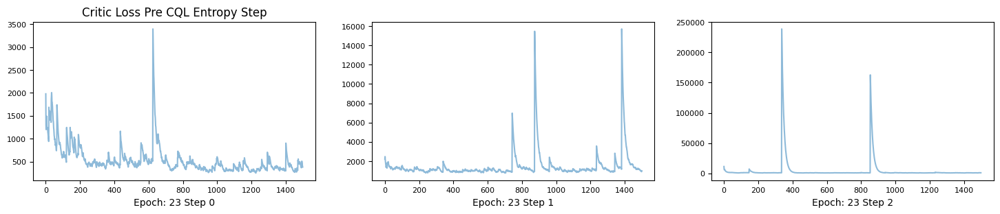

9816.802734375 37.81621551513672
57012.1171875 127.50303649902344
83113.75 36.56094741821289


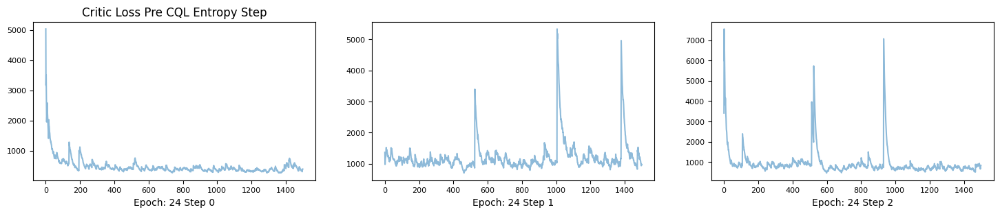

11349.41796875 41.18717956542969
128516.484375 169.80357360839844
221597.171875 28.89004898071289


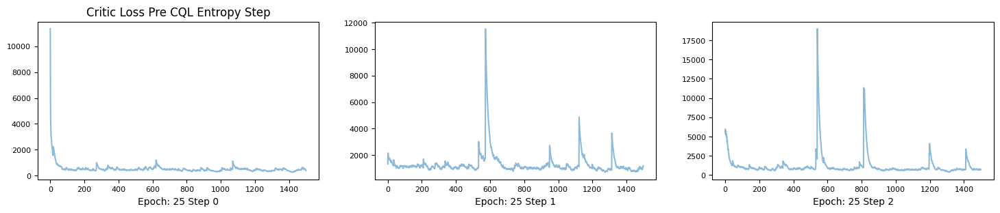

62841.6796875 35.09405517578125
70155.3359375 108.3046875
79965.59375 27.79901885986328


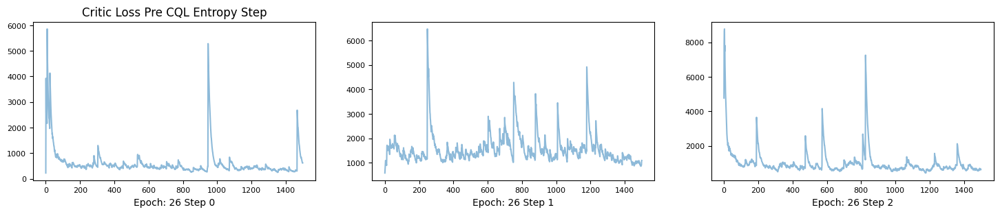

31356.41796875 55.16765213012695
42237.859375 132.79025268554688
747579.6875 33.33351516723633


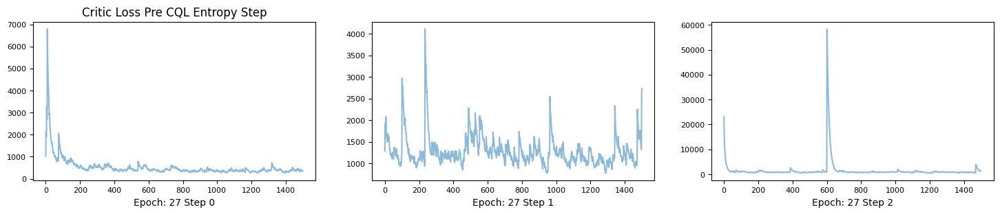

56992.16796875 31.741374969482422
358494.34375 158.68869018554688
192622.78125 56.46076965332031


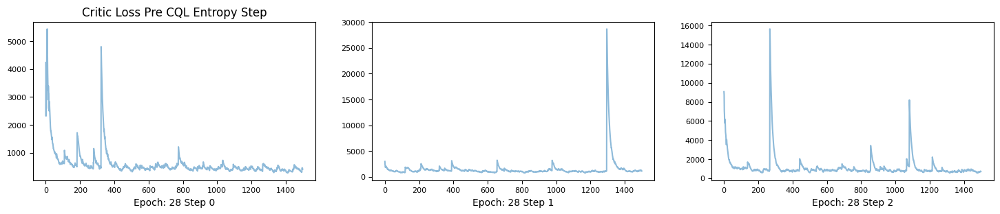

35085.85546875 32.616485595703125
137314.734375 124.21624755859375
5546080.0 35.38949203491211


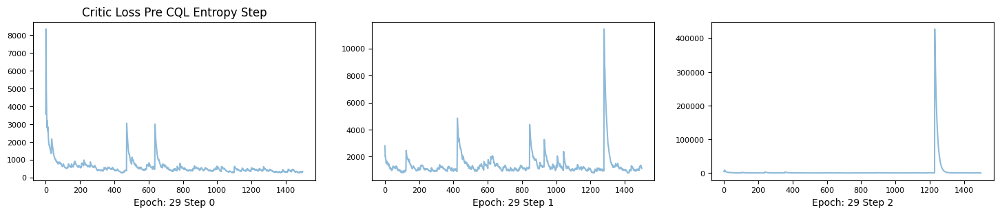

42302.65234375 50.60028076171875
86327.2421875 158.456787109375
270396.15625 55.94196319580078


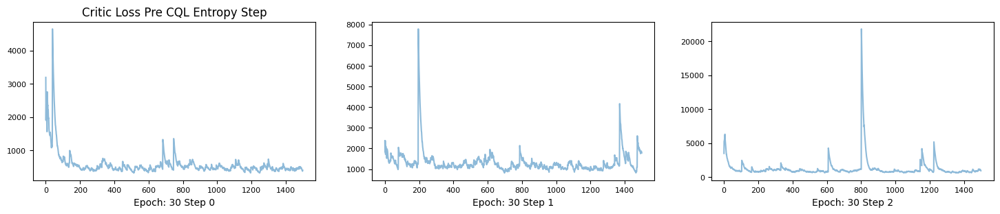

8365.7685546875 53.11267852783203
231696.9375 112.13995361328125
305200.21875 36.809730529785156


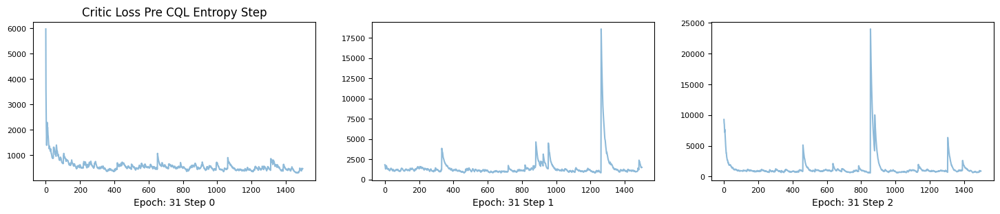

1036188.4375 68.8152084350586
87116.15625 148.10427856445312
187766.625 51.81709289550781


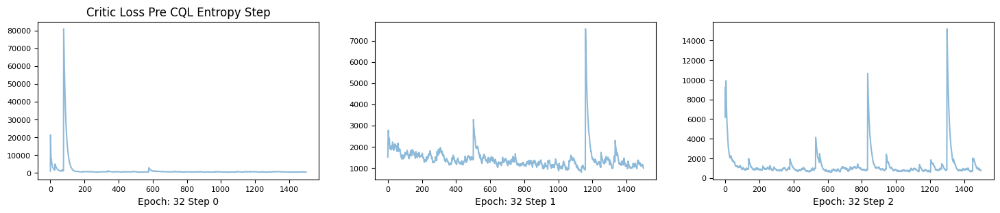

93422.2265625 47.9766845703125
91843.4140625 205.43826293945312
259929.171875 41.5782585144043


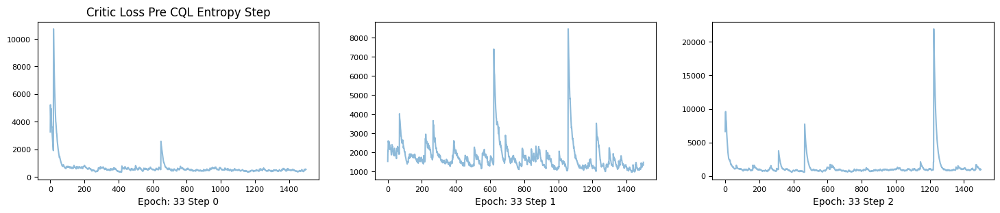

95452.8515625 58.51976013183594
57266.640625 205.49195861816406
1195924.0 53.66828918457031


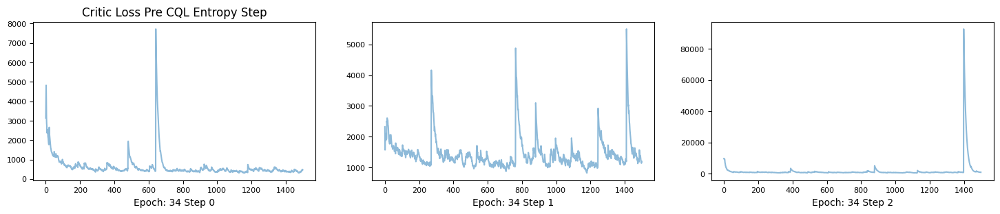

14592.08984375 36.94545364379883
208131.890625 225.98866271972656
50123.34375 21.03423500061035


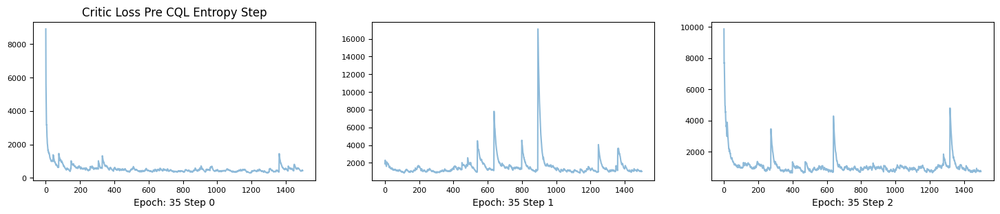

71801.8125 52.12102127075195
72409.5703125 189.0849151611328
438514.8125 62.48731231689453


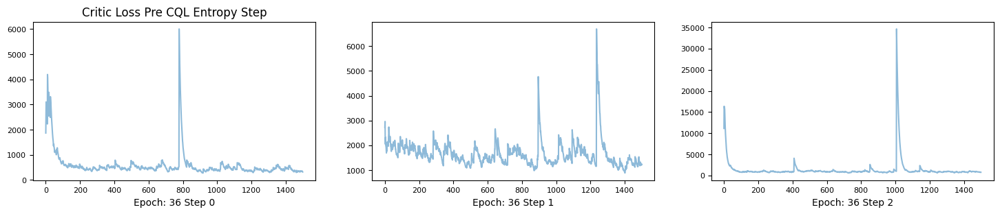

25612.22265625 54.462921142578125
221958.875 165.22979736328125
119801.5390625 42.1274528503418


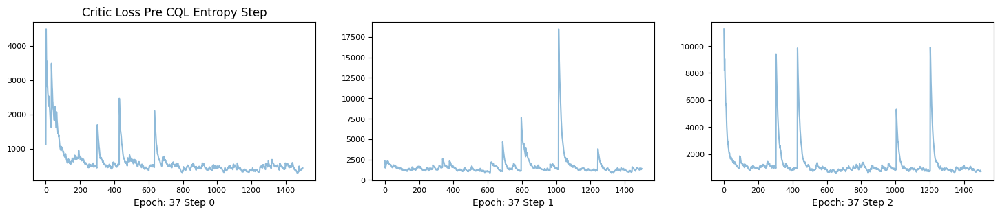

93915.015625 41.60327911376953
209060.71875 170.9862060546875
43653.609375 30.34743881225586


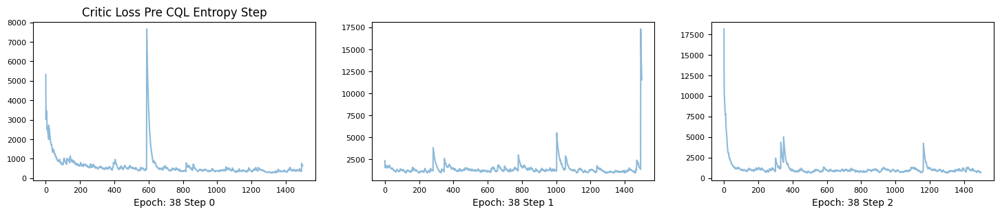

21142.47265625 59.32854461669922
121789.4453125 131.39100646972656
109608.203125 50.81511306762695


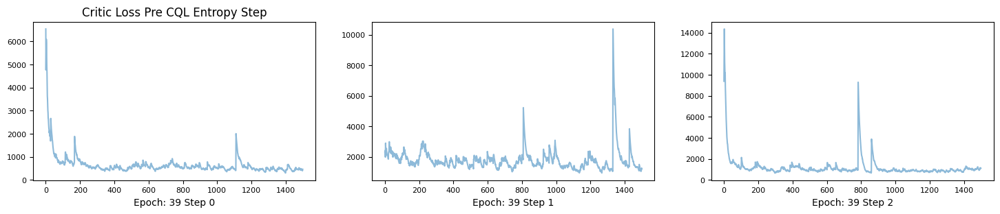

40341.1328125 38.116798400878906
18438.287109375 221.7015380859375
45174.85546875 49.51241683959961


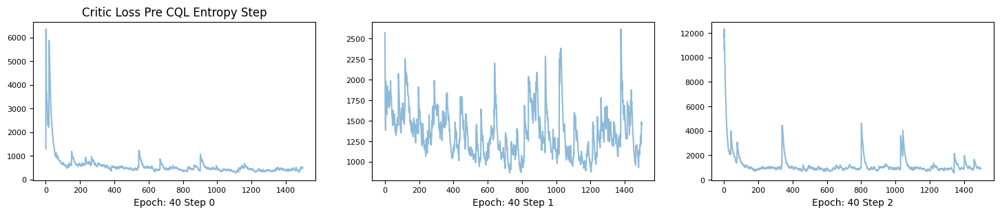

17300.85546875 65.48790740966797
226177.34375 185.823486328125
267036.5625 80.60055541992188


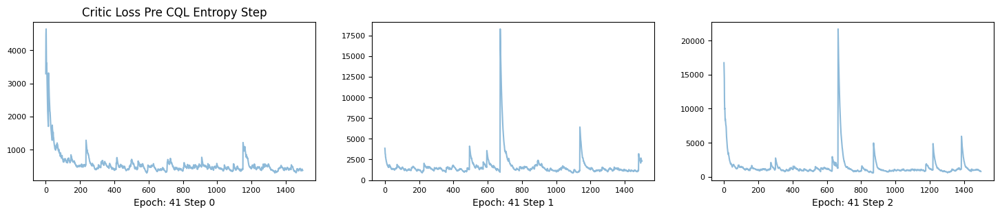

6430.6162109375 52.10694122314453
124581.2265625 240.11245727539062
679412.0625 36.935279846191406


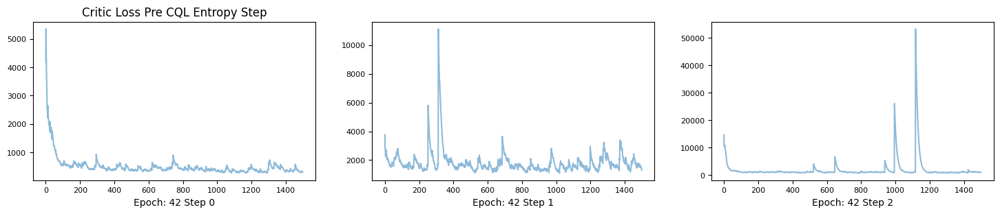

28188.412109375 60.68103790283203
46884.2734375 162.89488220214844
162333.0625 18.675495147705078


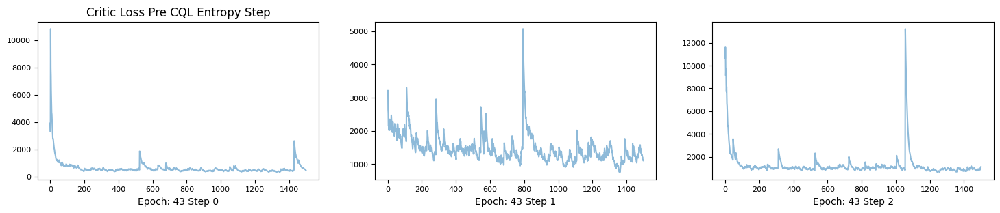

12490.99609375 59.99452209472656
207343.015625 189.44656372070312
2412088.75 31.736448287963867


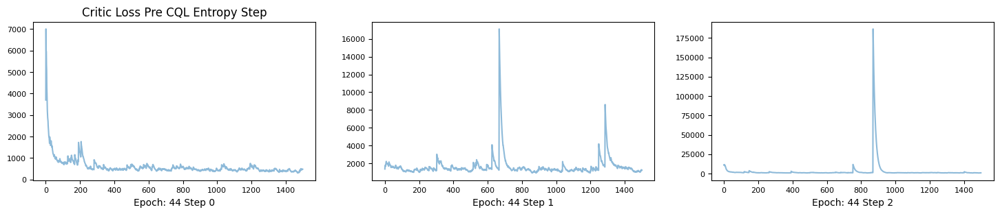

40586.51171875 41.53172302246094
72939.953125 129.77435302734375
139706.078125 42.926116943359375


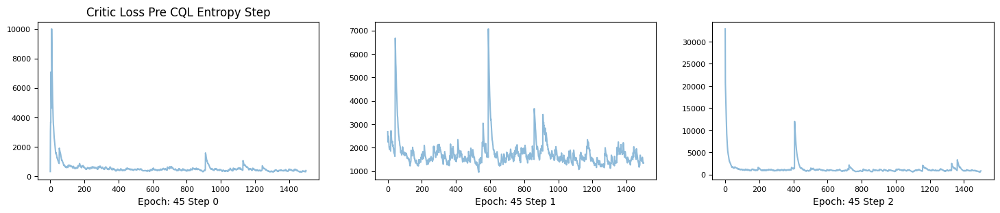

In [176]:
for idx, epoch in enumerate(log):
    actor_loss = grab(epoch, "critic_loss_pre")
    fig, axes = plt.subplots(1,len(actor_loss), figsize=(18, 3))
    for step, loss in enumerate(actor_loss):
        print(max(loss), min(loss))
        axes[step].plot(list(range(len(loss))), pd.Series.ewm(pd.Series(loss), span=25).mean(), label = f"Epoch: {idx} Step {step}", alpha = 0.5)
        axes[step].tick_params(axis='both', which='major', labelsize=8)
        axes[step].set_xlabel(f"Epoch: {idx} Step {step}")
        if step == 0:
            axes[step].set_title(f"Critic Loss Pre CQL Entropy Step")
    plt.show()

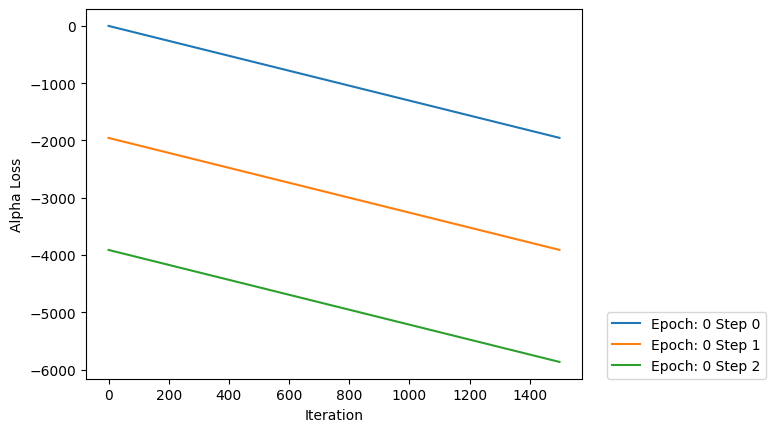

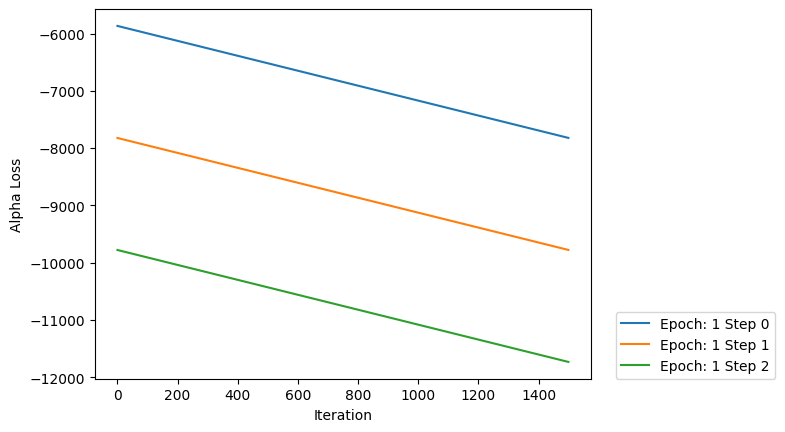

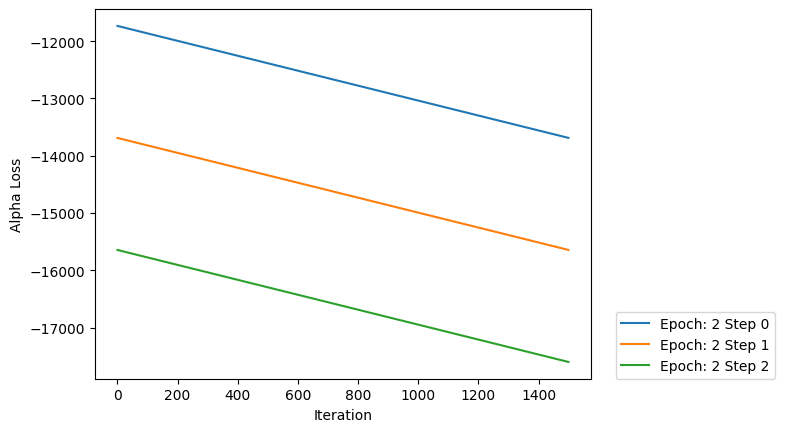

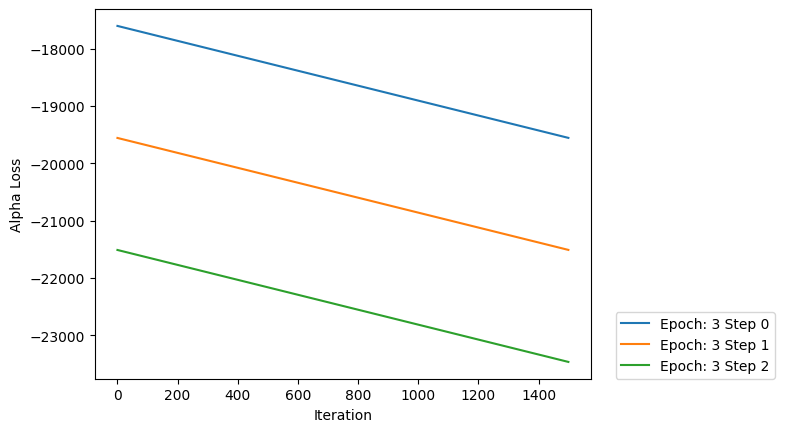

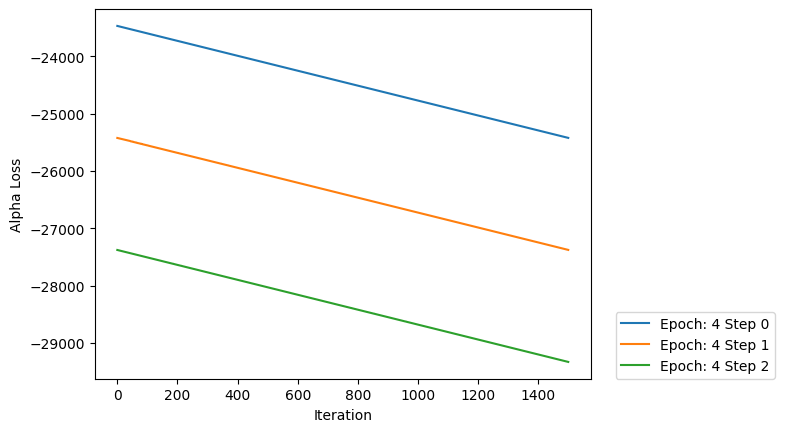

...

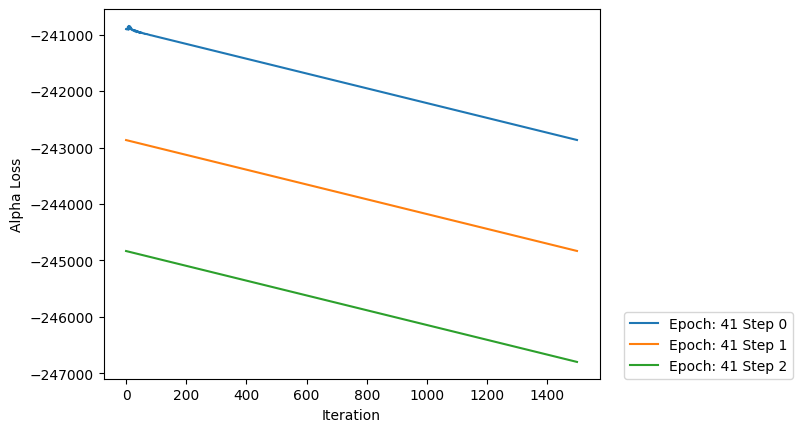

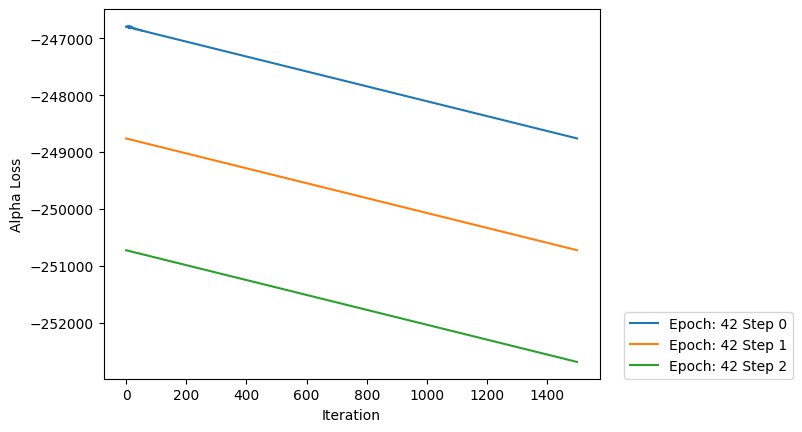

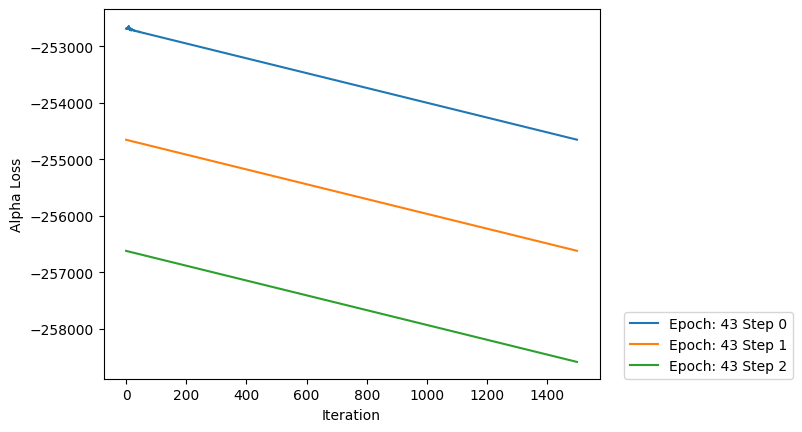

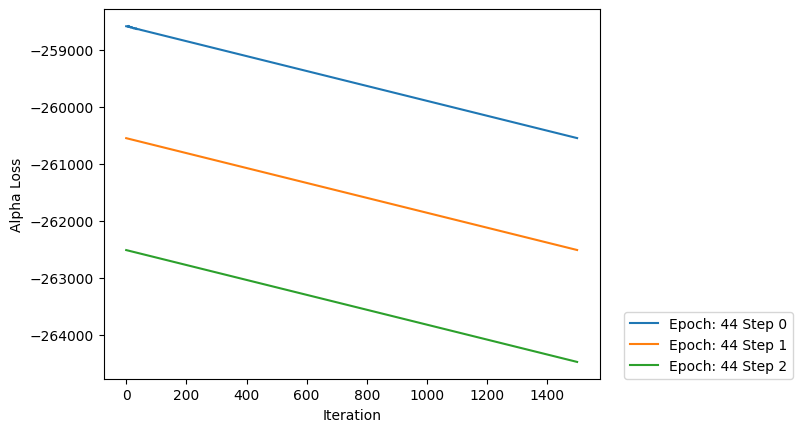

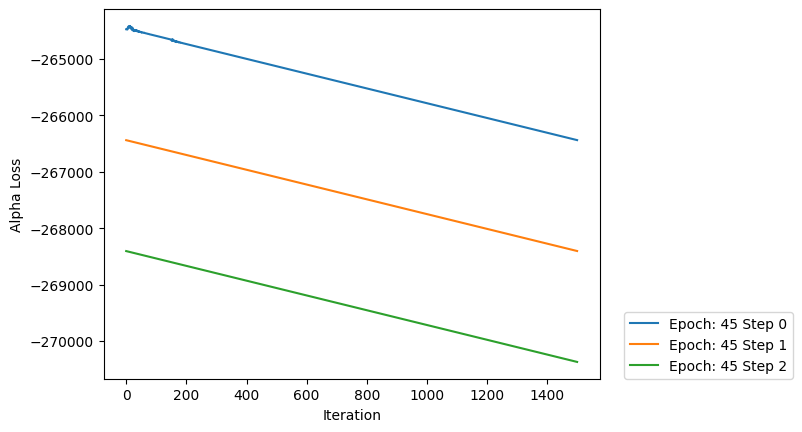

In [177]:
for idx, epoch in enumerate(log):
    actor_loss = grab(epoch, "alpha_loss")
    for step, loss in enumerate(actor_loss):
        plt.plot(list(range(len(loss))), loss, label = f"Epoch: {idx} Step {step}")
    plt.legend(loc = (1.05, 0))
    plt.xlabel("Iteration")
    plt.ylabel("Alpha Loss")
    plt.show()

9319.5498046875 51.887176513671875
7766.0859375 1760.92431640625
5752.8203125 1698.2469482421875


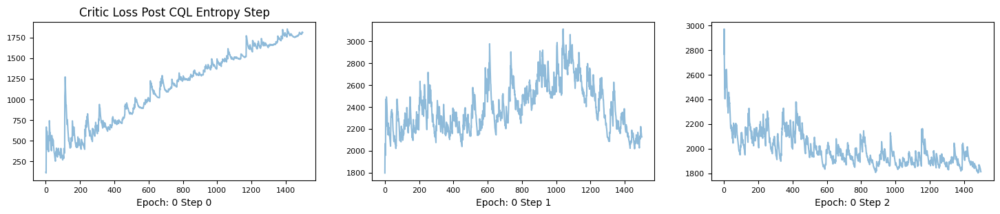

5140.2724609375 1774.057373046875
12353.646484375 2668.709716796875
11608.4521484375 2613.20703125


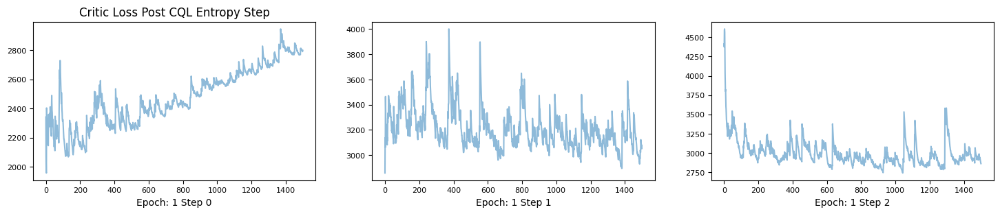

18227.18359375 2762.45458984375
18558.9140625 3483.79150390625
28099.40234375 3354.20654296875


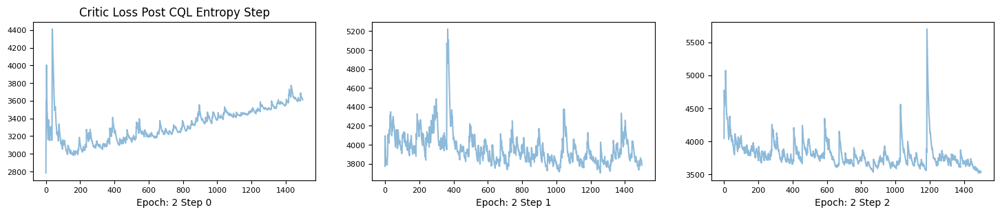

7057.02978515625 3526.70947265625
16545.515625 4187.4541015625
60269.484375 3962.061279296875


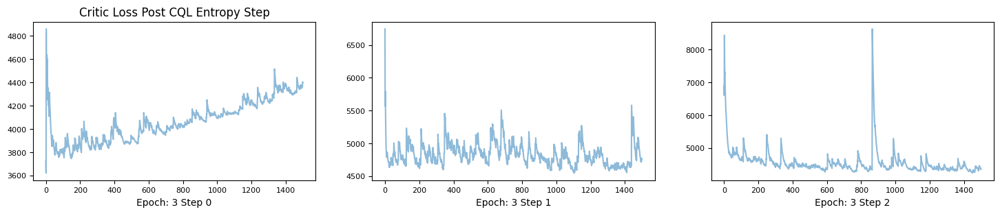

32562.830078125 4275.76513671875
38989.234375 4512.19287109375
73103.8984375 4361.5595703125


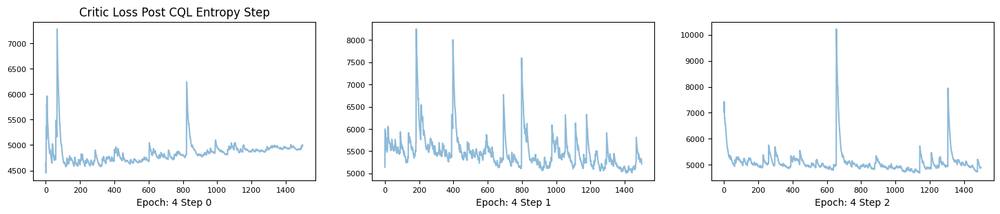

13668.8310546875 4821.859375
36349.41796875 4966.9091796875
124055.9765625 4900.716796875


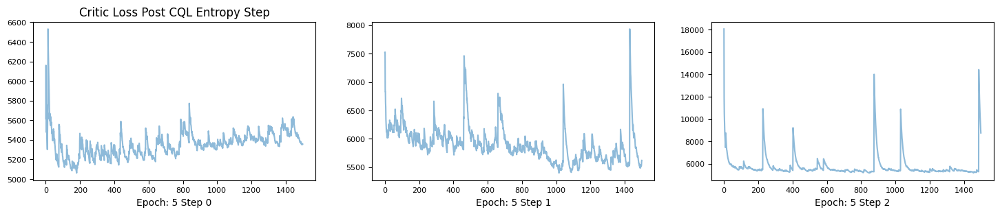

13026.66796875 5213.42724609375
37416.51171875 5314.5458984375
37764.265625 5144.29931640625


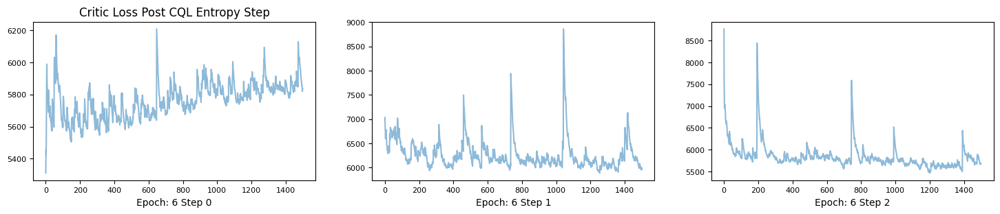

15188.01171875 5662.15771484375
250776.875 5685.9794921875
43112.5703125 5453.25732421875


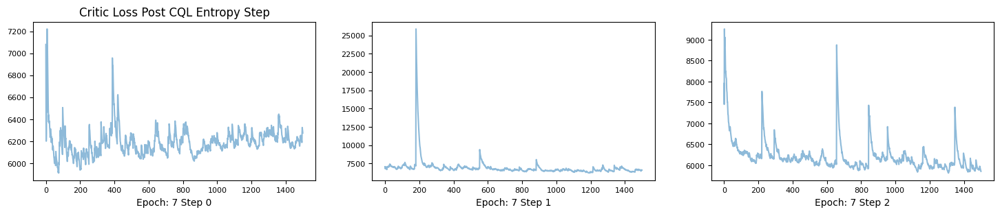

22645.1953125 5996.6806640625
80782.7890625 6093.64453125
51115.21484375 5798.0810546875


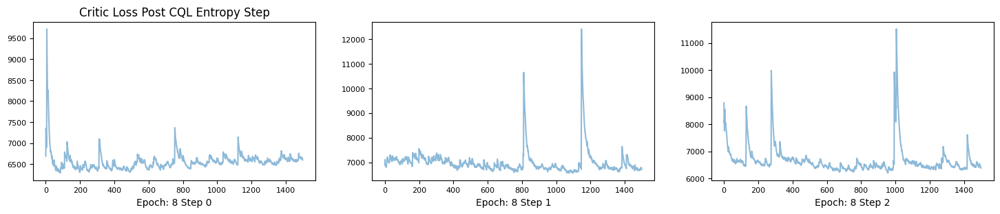

271952.25 6189.8154296875
87553.828125 6346.978515625
48953.4921875 6138.96240234375


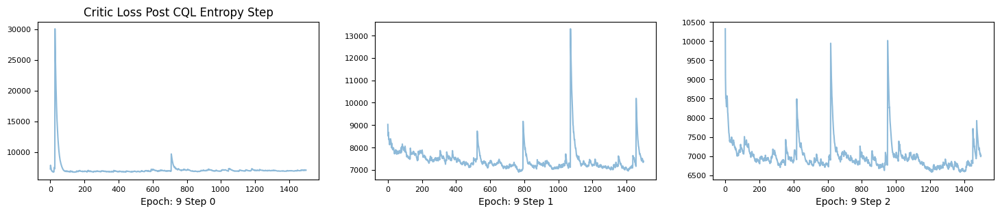

17855.615234375 6751.39453125
42083.515625 6575.87744140625
201850.90625 6473.09814453125


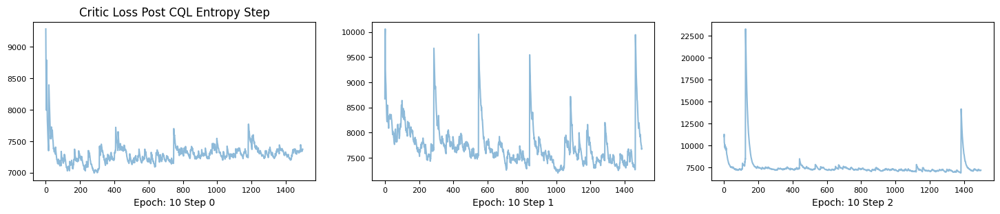

491463.6875 7030.943359375
148338.328125 6858.59765625
55111.28125 6664.046875


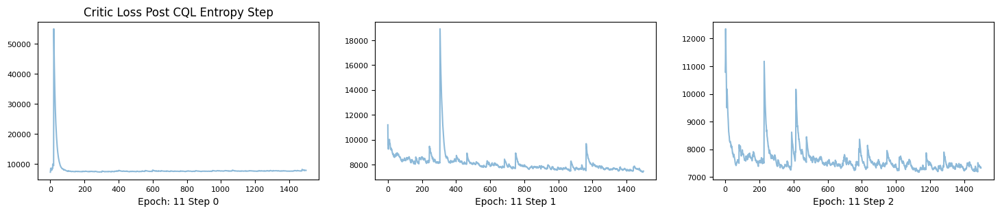

20194.244140625 7155.9384765625
229468.484375 6852.140625
78020.3359375 6821.9951171875


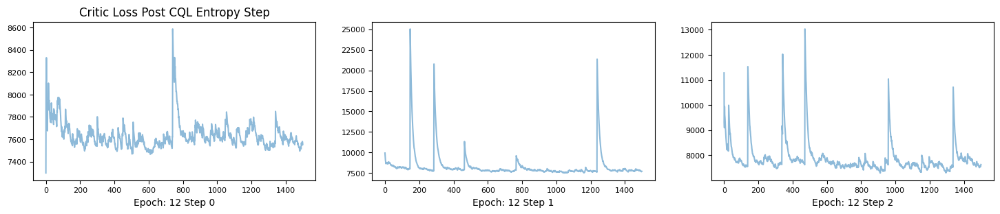

26018.736328125 7276.62548828125
44321.16796875 6999.029296875
52474.1796875 6492.2998046875


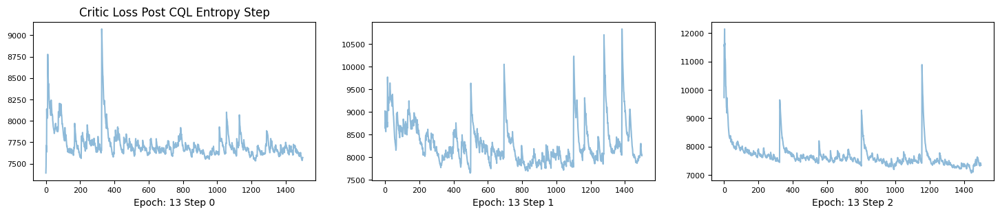

26573.921875 7135.54052734375
31414.353515625 6922.7177734375
89622.5390625 6606.7080078125


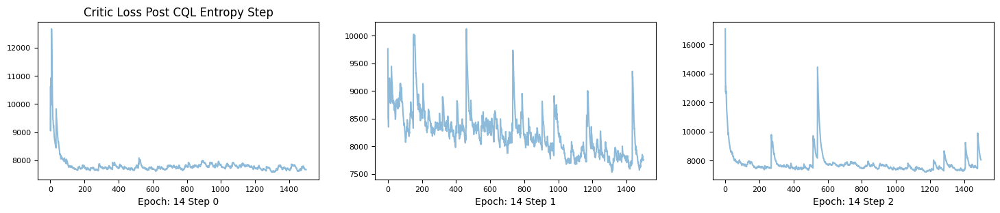

90802.6953125 7285.19970703125
53051.07421875 6922.7939453125
115048.578125 6680.61572265625


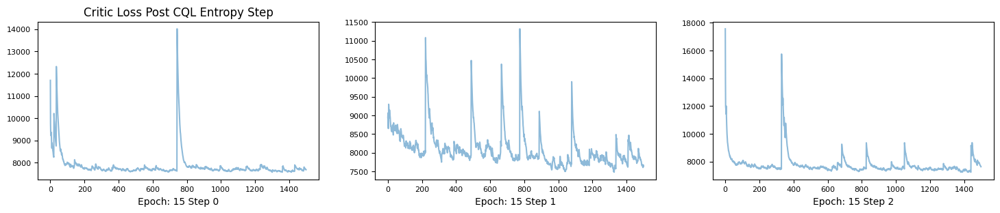

124409.8203125 7271.17919921875
58523.94140625 6754.1640625
78674.3359375 6541.1875


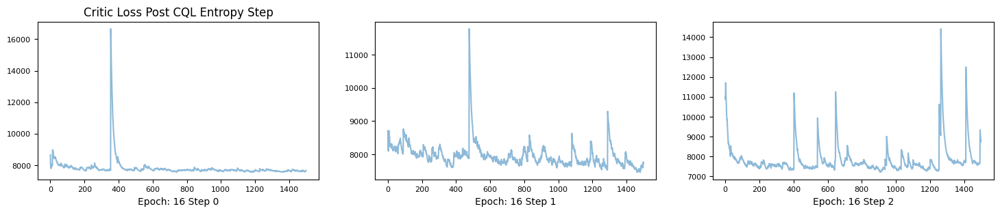

16635.6328125 7253.4736328125
276434.96875 6913.71484375
96003.234375 6674.58349609375


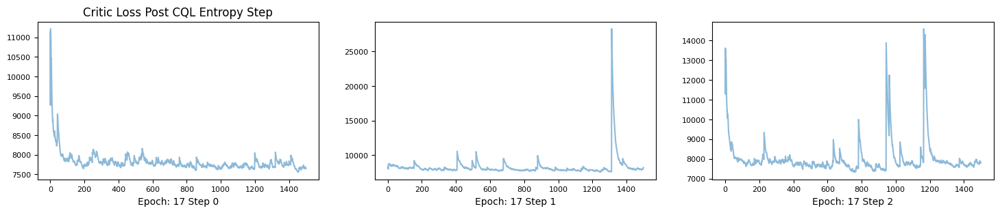

20622.439453125 7279.408203125
104161.625 6772.80224609375
258161.4375 6558.2919921875


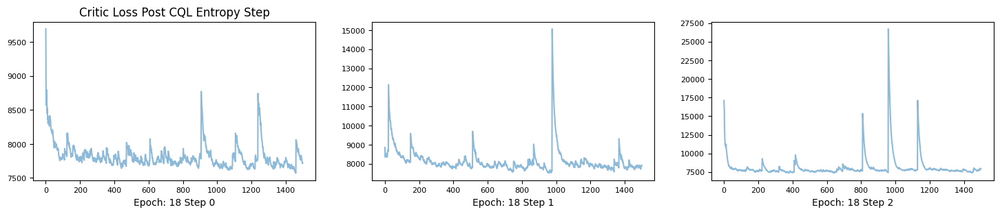

23239.421875 7335.0712890625
230332.296875 6887.92236328125
1565315.0 6726.4677734375


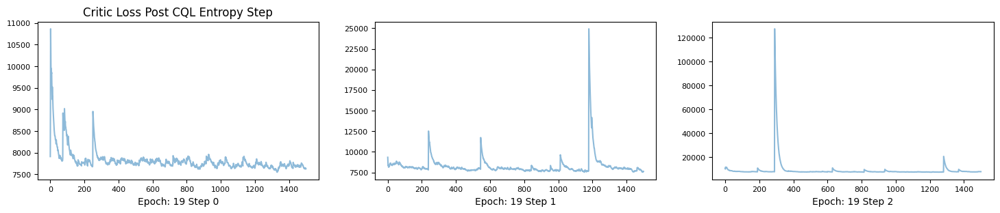

556056.375 7315.9189453125
67024.0625 6728.2529296875
226305.140625 6563.7666015625


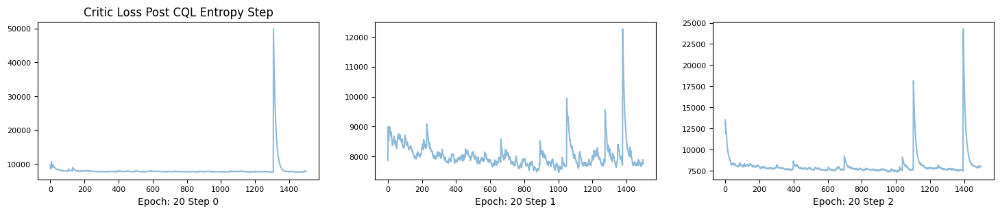

18188.943359375 7315.6416015625
121721.765625 6436.7353515625
703399.125 6710.349609375


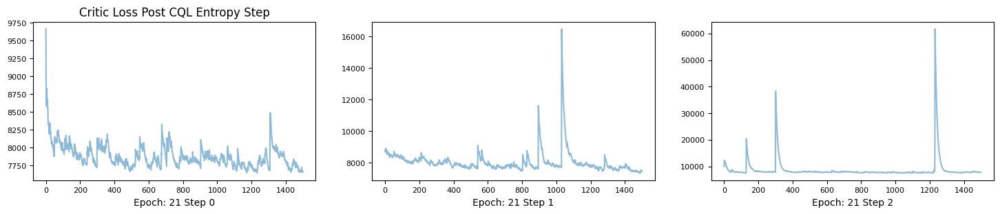

206717.140625 7287.087890625
67886.75 6440.009765625
140458.328125 6777.21630859375


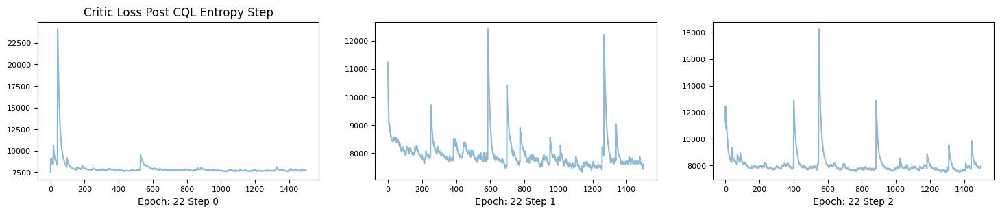

45268.0546875 7263.9716796875
196700.25 6773.55810546875
3101183.5 7082.1025390625


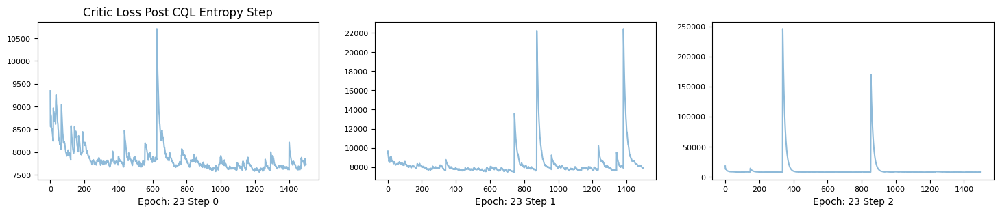

17182.51953125 7269.2451171875
63630.3671875 6925.78759765625
90453.375 6824.64453125


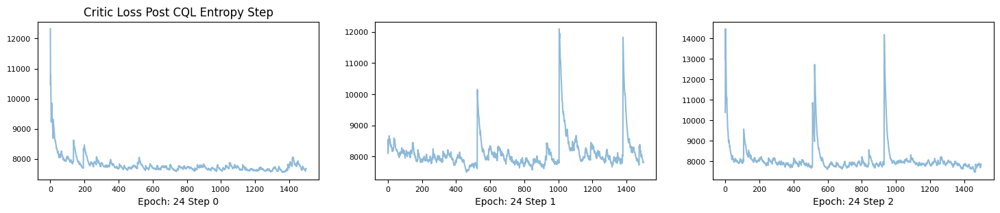

18570.1171875 7248.8935546875
135397.375 6611.08056640625
228335.9375 6627.9140625


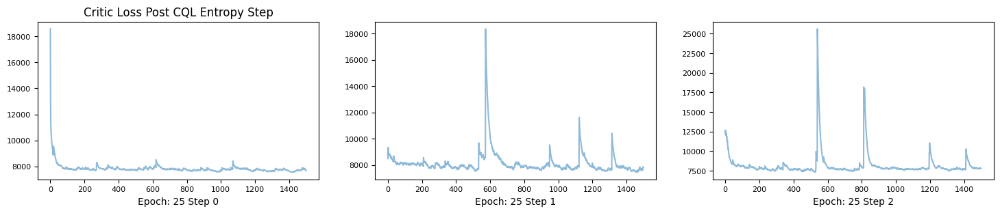

70167.953125 7233.5
76846.3515625 6713.9248046875
86897.421875 6798.75927734375


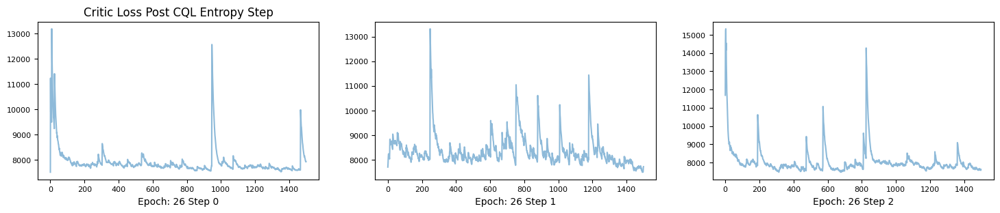

38732.14453125 7271.9267578125
48950.68359375 6775.009765625
754668.25 6747.95068359375


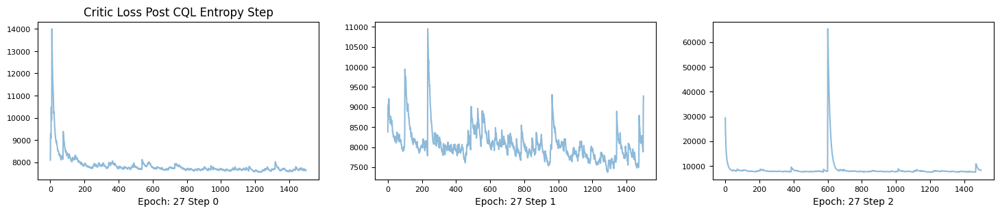

64273.78125 7302.087890625
365161.6875 6813.44140625
199585.421875 6566.5185546875


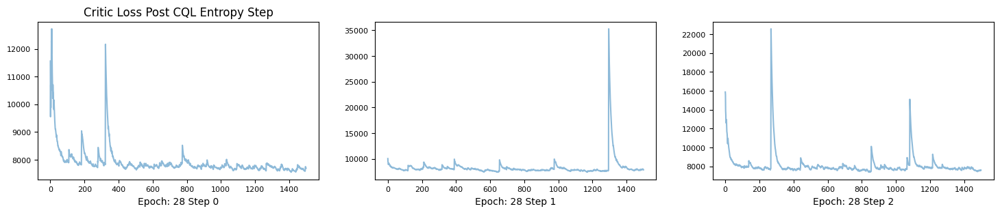

42419.01171875 7239.546875
144297.3125 6726.05126953125
5553072.5 6808.8525390625


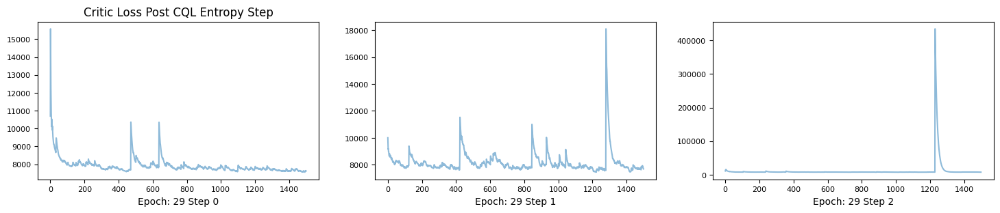

49622.66015625 7236.376953125
93176.9296875 6663.10986328125
277242.96875 6947.7587890625


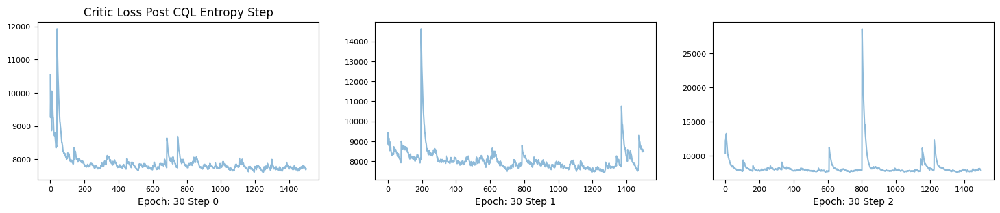

15630.39453125 7259.78125
238215.046875 6637.6025390625
312113.4375 6641.9580078125


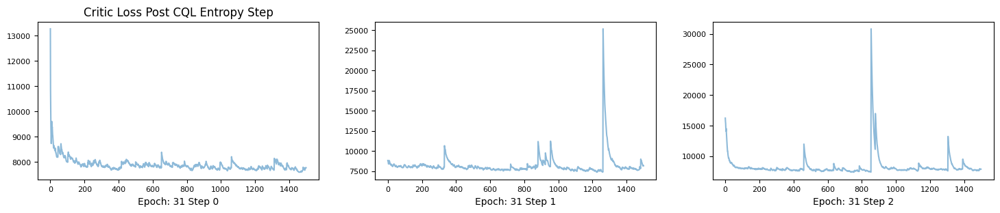

1043632.3125 7424.5380859375
93777.53125 6904.56689453125
194887.90625 6886.1015625


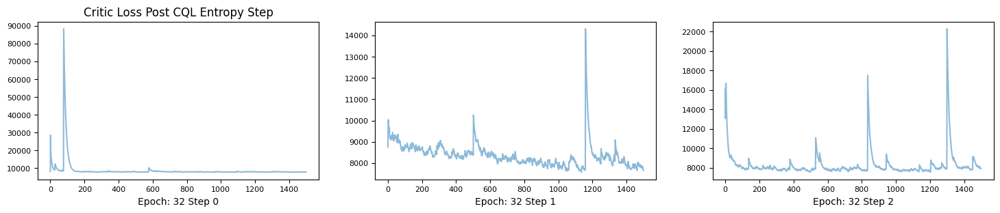

100803.3125 7381.513671875
98718.75 6813.19189453125
266684.09375 6939.6455078125


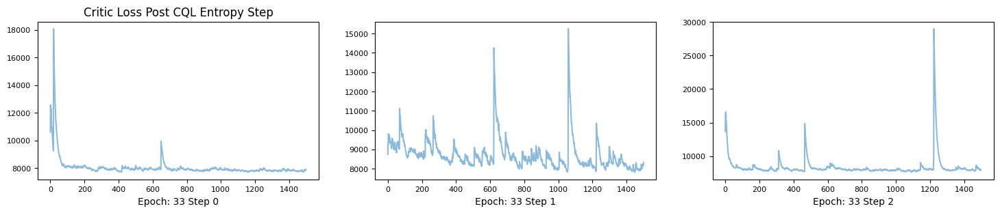

102799.5 7376.8603515625
63898.4765625 6781.98193359375
1202413.75 6467.767578125


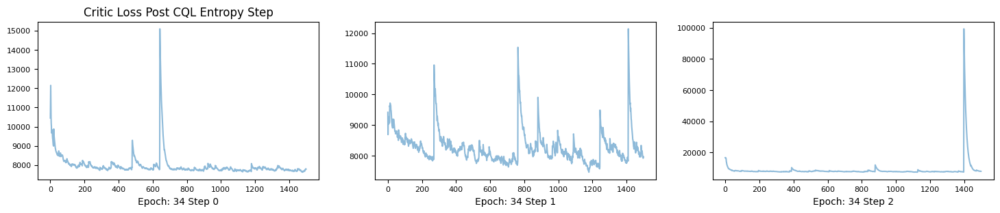

21852.32421875 7285.4716796875
215052.953125 6762.3798828125
56952.26171875 6793.654296875


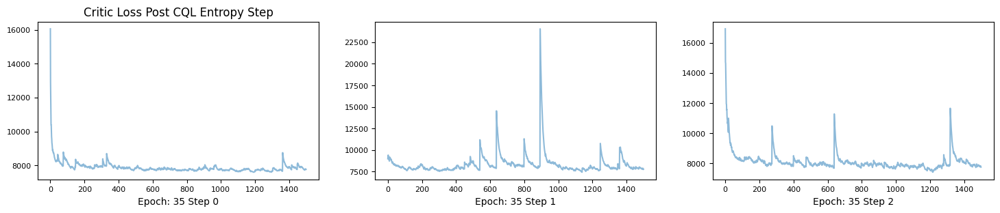

79069.8828125 7358.11376953125
78857.078125 6818.7744140625
445499.65625 6883.1376953125


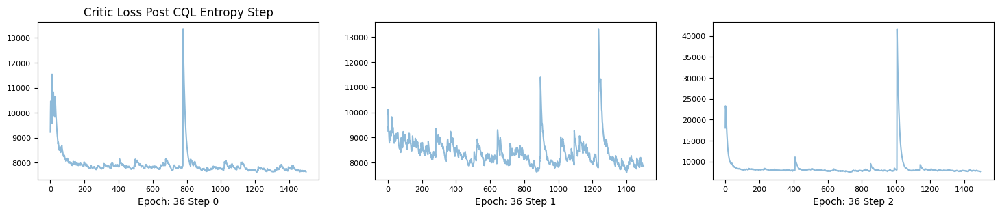

32916.328125 7303.01953125
228801.0625 6582.9052734375
126835.21875 6778.3837890625


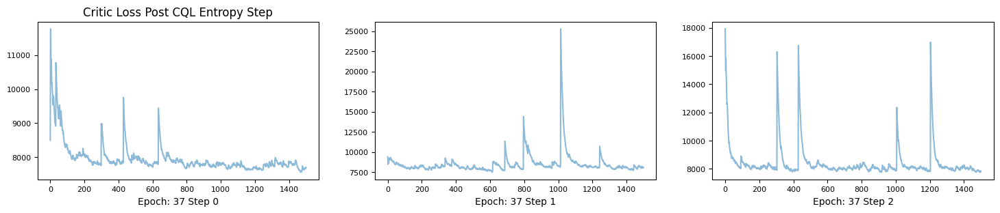

101164.859375 7231.921875
215935.390625 6725.56884765625
50568.37109375 6790.4501953125


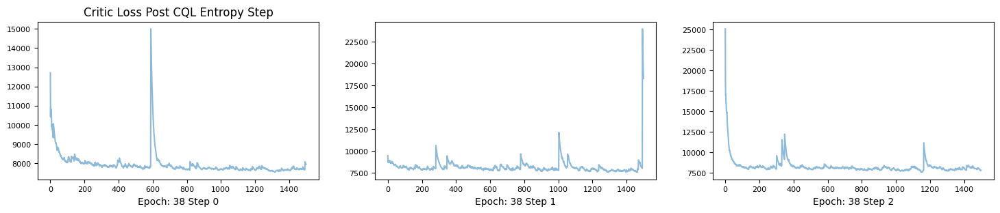

28510.05078125 7330.966796875
128579.6953125 6738.7265625
116592.3359375 6700.578125


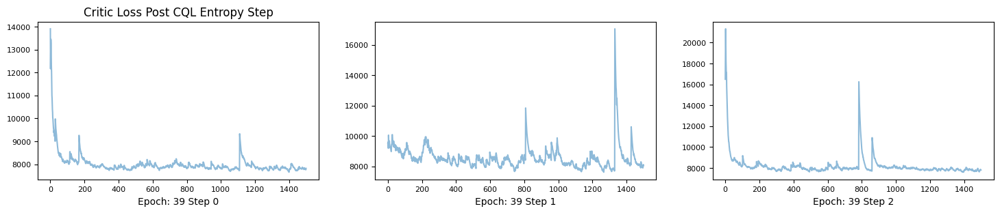

47625.4296875 7231.1767578125
25067.736328125 6578.8232421875
51691.92578125 6517.97265625


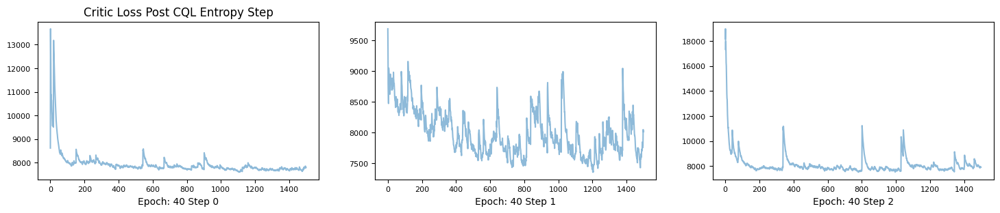

24670.36328125 7262.1513671875
232842.46875 6381.70751953125
274217.75 6615.60888671875


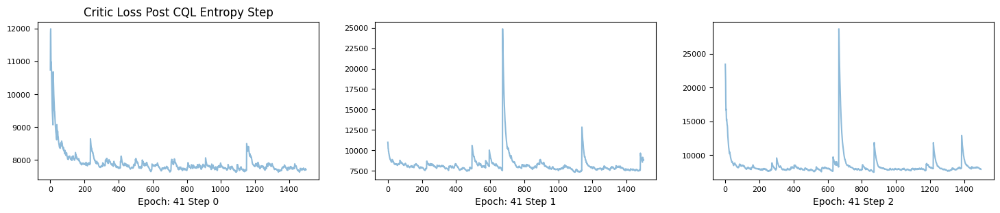

13866.9736328125 7241.8427734375
131345.734375 6842.33056640625
686494.5 6563.470703125


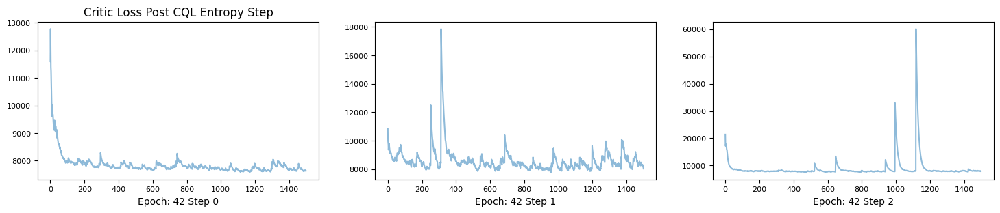

35546.828125 7328.9931640625
53482.89453125 6473.6845703125
169228.75 6861.4140625


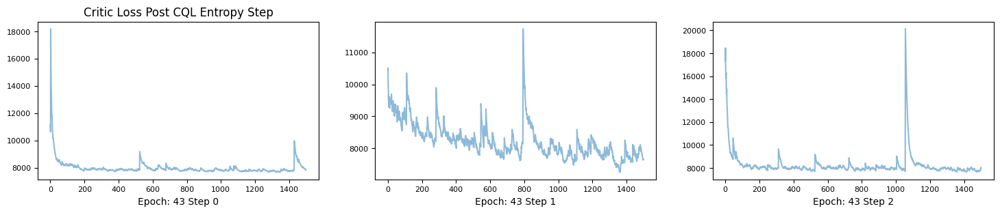

19924.494140625 7233.1748046875
213616.5 6353.7421875
2419383.75 6738.1875


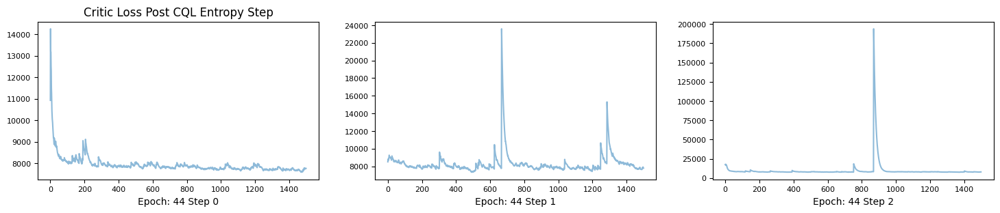

47899.09375 7273.42236328125
79443.703125 6701.2412109375
146645.015625 6722.8603515625


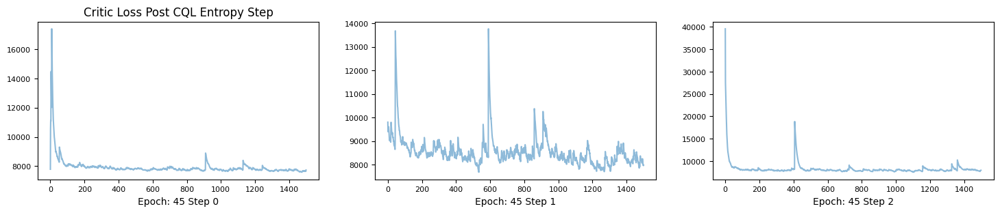

In [178]:
for idx, epoch in enumerate(log):
    actor_loss = grab(epoch, "critic_loss")
    fig, axes = plt.subplots(1,len(actor_loss), figsize=(18, 3))
    for step, loss in enumerate(actor_loss):
        print(max(loss), min(loss))
        axes[step].plot(list(range(len(loss))), pd.Series.ewm(pd.Series(loss), span=25).mean(), label = f"Epoch: {idx} Step {step}", alpha = 0.5)
        axes[step].tick_params(axis='both', which='major', labelsize=8)
        axes[step].set_xlabel(f"Epoch: {idx} Step {step}")
        if step == 0:
            axes[step].set_title(f"Critic Loss Post CQL Entropy Step")
    plt.show()

83.73139953613281 22.920085906982422
23.015445709228516 21.260112762451172
23.01250457763672 22.165042877197266


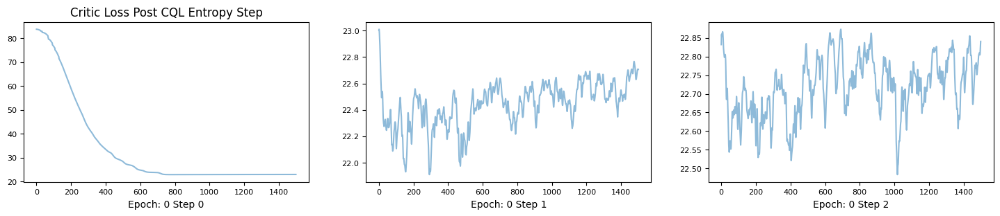

23.02631378173828 22.850645065307617
23.026092529296875 22.613250732421875
23.01696014404297 22.808670043945312


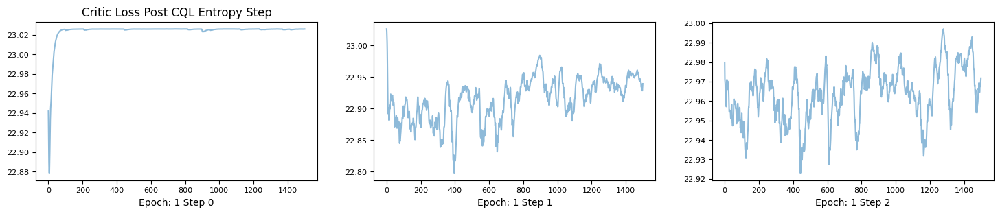

23.026996612548828 22.983558654785156
23.02466583251953 22.938125610351562
23.024791717529297 22.980281829833984


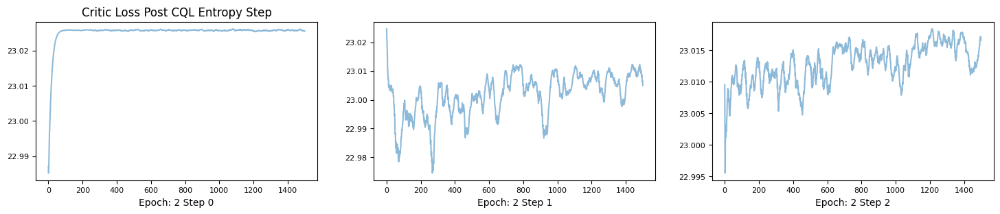

23.027042388916016 23.01712417602539
23.026290893554688 23.002933502197266
23.026256561279297 23.01313018798828


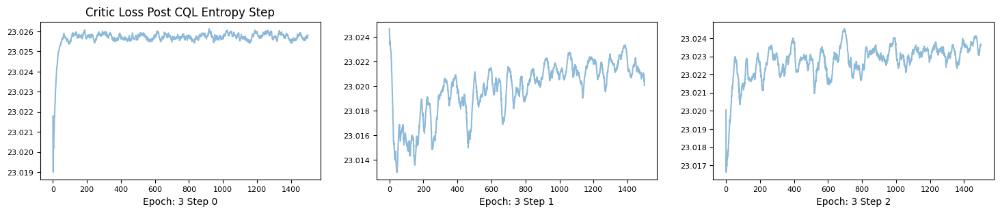

In [334]:
for idx, epoch in enumerate(log):
    actor_loss = grab(epoch, "entropy")
    fig, axes = plt.subplots(1,len(actor_loss), figsize=(18, 3))
    for step, loss in enumerate(actor_loss):
        print(max(loss), min(loss))
        axes[step].plot(list(range(len(loss))), pd.Series.ewm(pd.Series(loss), span=25).mean(), label = f"Epoch: {idx} Step {step}", alpha = 0.5)
        axes[step].tick_params(axis='both', which='major', labelsize=8)
        axes[step].set_xlabel(f"Epoch: {idx} Step {step}")
        if step == 0:
            axes[step].set_title(f"Critic Loss Post CQL Entropy Step")
    plt.show()

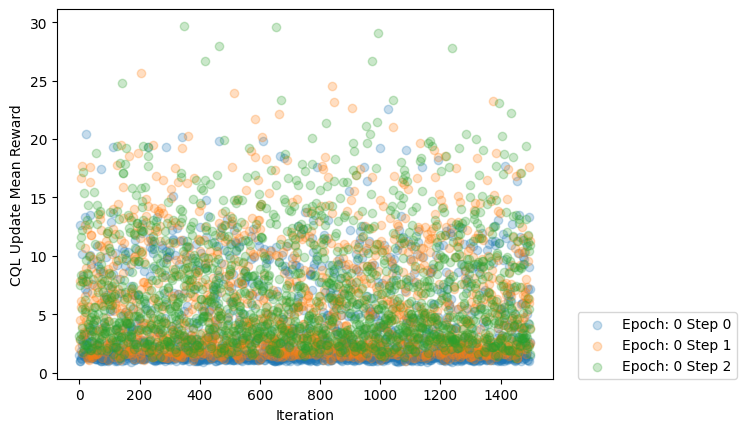

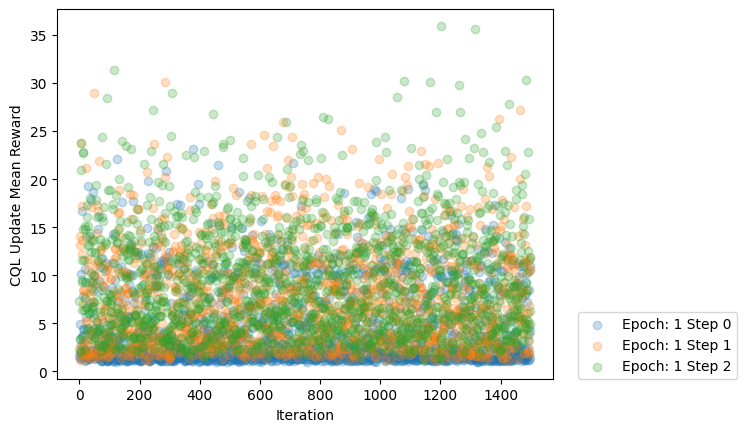

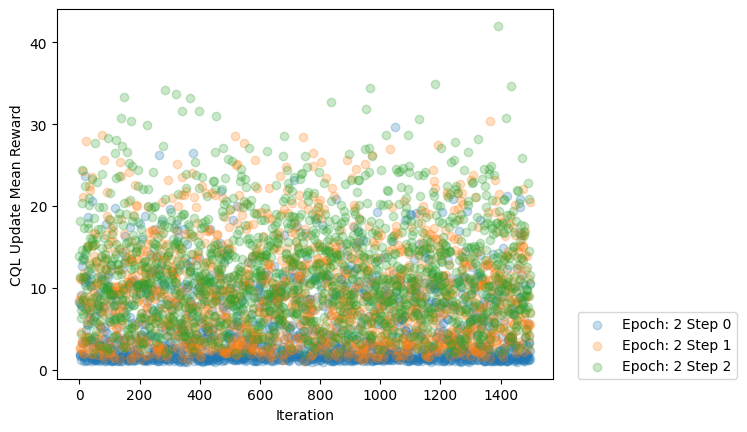

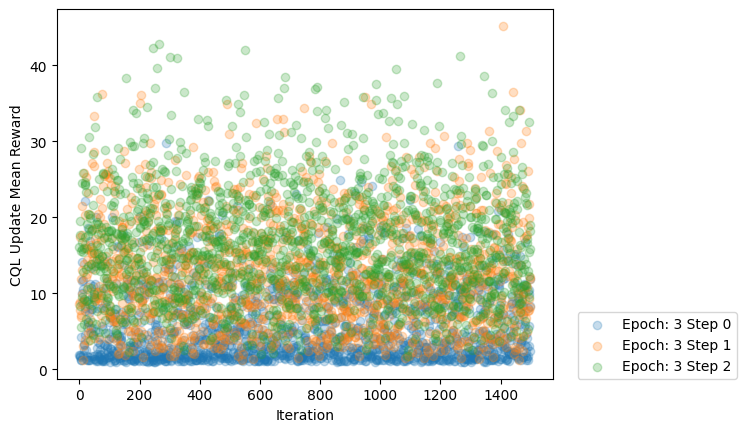

In [335]:
for idx, epoch in enumerate(log):
    actor_loss = grab(epoch, "cql_update_mean_reward")
    for step, loss in enumerate(actor_loss):
        plt.scatter(list(range(len(loss))), loss, label = f"Epoch: {idx} Step {step}", alpha=0.25)
    plt.legend(loc = (1.05, 0))
    plt.xlabel("Iteration")
    plt.ylabel("CQL Update Mean Reward")
#     plt.title("Step Reward layer Stacking a result of Buffer Cleaning")
    plt.show()

# Testing the learned policy

In [184]:
with open(f"/home/yangk/dreidenbach/rl/molecule/data/dags_drd2_reactants_0.99999.pkl", "rb") as f:
    test_reactants = pickle.load(f)

In [190]:
sys.path.insert(0, '/home/yangk/dreidenbach/rl/molecule/syn')
from mlp import MLPPolicy
save_name = "discrete_horizon_3_max_q_10_scale_2_explore_DRD2_discount_23_iter_clean_buffer_qupdate"
policy_path = f"/home/yangk/dreidenbach/rl/molecule/model_ckpt/policy_{save_name}.pt"
actor = MLPPolicy(ac_dim = 4344, ob_dim = 32, n_layers = 3, size = 6000, learning_rate = 1e-4, device = "cuda:0")

actor.load_state_dict(torch.load(policy_path, map_location=torch.device("cuda:0")))
actor

MLPPolicy(
  (logits_na): Sequential(
    (0): Linear(in_features=32, out_features=6000, bias=True)
    (1): Tanh()
    (2): Linear(in_features=6000, out_features=6000, bias=True)
    (3): Tanh()
    (4): Linear(in_features=6000, out_features=6000, bias=True)
    (5): Tanh()
    (6): Linear(in_features=6000, out_features=4344, bias=True)
    (7): Identity()
  )
)

In [194]:
test_reactants[0]

('ClCCCBr', 'COc1cccc(CCl)c1')

In [208]:
react_set = set()
bad_set = set()
for rs in test_reactants:
    print(rs)
    if rs[0] not in react_set and rs[0] not in bad_set:
        try:
            m1, _ = latent_space.encode([rs[0]])
            rs0 = latent_space.decode(m1)[0]
    #         print(rs[0], rs0)
            if rs[0] == rs0:
                react_set.add(rs[0])
            else:
                bad_set(rs[0])
#         assert(1==0)
        except:
            bad_set.add(rs[0])
    if rs[1] not in react_set and rs[1] not in bad_set:
        try:
            m1, _ = latent_space.encode([rs[1]])
            rs0 = latent_space.decode(m1)[0]
            if rs[1] == rs0:
                react_set.add(rs[1])
            else:
                bad_set(rs[1])
        except:
            bad_set.add(rs[1])
                

('ClCCCBr', 'COc1cccc(CCl)c1')
('ClCCCI', 'COc1ccccc1CCl')
('COc1ccc(Cl)cc1', 'ClCCCCCl')
('Cc1ccccc1Br', 'BrCCCCBr')
('Cc1ccccc1I', 'BrCCCCBr')
('COc1ccc(Cl)cc1', 'ClCCCCI')
('ClCCCCCl', 'O=Cc1ccccc1O')
('Fc1ccc([Mg+])cc1', 'BrCCCCCBr')
('BrCCCCCBr', 'O=Cc1ccccc1O')
('BrCCCCCBr', 'Cc1ccccc1N1CCNCC1')
('Clc1cccc(N2CCNCC2)c1Cl', 'BrCCCCBr')
('Clc1cccc(N2CCNCC2)c1Cl', 'NCCc1c[nH]c2ccccc12')
('Fc1ccc(CBr)cc1', 'BrCCCCCBr')
('BrCCCCc1ccccc1', 'Clc1cccc(N2CCNCC2)c1Cl')
('BrCCCCCBr', 'Clc1ccc(N2CCNCC2)cc1')
('BrCCCCCBr', 'COc1ccccc1Br')
('BrCCCBr', 'COc1ccccc1CCl')
('ClCCCCBr', 'c1ccc2c(c1)CCN2')
('c1ccc2c(N3CCNCC3)nsc2c1', 'ClCCCCBr')
('ClCCCCCl', 'N#Cc1ccccc1F')
('ClCCCCCBr', 'Brc1ccc(Br)cc1')
('ClCCCBr', 'COc1ccccc1CCl')
('OCCCBr', 'O=C1CCc2c(O)cccc21')
('BrCCCCBr', 'CSc1ccccc1')
('COc1ccccc1Br', 'ClCCCCBr')
('BrCCCCBr', 'c1ccc2c(N3CCNCC3)nsc2c1')
('BrCCCBr', 'Fc1ccc2c(C3CCNCC3)noc2c1')
('Fc1cccc(Br)c1', 'BrCCCCCBr')
('ClCCCCI', 'Cc1ccccc1CBr')
('NC1CCc2ccccc21', 'ClCCCCCBr')
('BrCc1ccc(B

In [209]:
len(bad_set), len(react_set)

(20, 33)

In [212]:
test_map = {}
for idx, rs in enumerate(test_reactants):
    val = -1
    if rs[0] in react_set and rs[1] in react_set:
        val = 2
    elif rs[0] in react_set and rs[1] not in react_set:
        val = 0
    elif rs[0] not in react_set and rs[1] in react_set:
        val = 1
    test_map[rs] = val

In [214]:
state_actions = []
for k, v in test_map.items():
    if v == 0 or v == 2:
        point = (k[0], k[1])
        state_actions.append(point)
    if v ==1 or v == 2:
        point = (k[1], k[0])
        state_actions.append(point)
len(state_actions)

103

In [216]:
with open("/home/yangk/dreidenbach/rl/molecule/data/combo_buffer_JNK3_V3_discrete_map_inv.pkl", "rb") as f:
    action_map_inv = pickle.load(f)
with open("/home/yangk/dreidenbach/rl/molecule/data/combo_buffer_JNK3_V3_discrete_map.pkl", "rb") as f:
    action_map = pickle.load(f)

def discretize(actions):
    return torch.Tensor([action_map[smi] for smi in actions])

def undiscretize(actions):
    if type(actions) != np.ndarray:
        return [action_map_inv[x] for x in actions.detach().cpu().numpy()]
    else:
        return [action_map_inv[x] for x in actions]

In [310]:
def build_tree(smi_state, k = 10):
    if type(smi_state) == str:
        all_states = [[smi_state], [], [], []]
    else:
        all_states = [smi_state, [], [], []]
    all_actions = [[], [], []]
    all_products = [[], [], []]
    for layer in range(3):
        states = all_states[layer]
        z, bad_idx = latent_space.encode(states)
        states = np.asarray([j for i, j in enumerate(states) if i not in bad_idx])
        action_dist = actor(z)
        actions = [set() for _ in range(z.shape[0])]
        for _ in range(k):
            acts = action_dist.sample().tolist()
            for i, act in enumerate(acts):
                actions[i].add(act)
        smi_actions = [undiscretize(np.asarray(list(acts))) for acts in actions]
        react_states = []
        for idx, s in enumerate(states):
            react_states.extend([s]*len(smi_actions[idx]))
        smi_actions = sum(smi_actions, [])
        all_actions[layer].extend(smi_actions)
        _, prods = dynamics.react(react_states, smi_actions)
        prods = sum(prods, [])
        all_products[layer].extend(list(set(prods)))
        all_states[layer+1].extend(list(set(prods)))
    return all_states, all_actions, all_products

In [315]:
import time
def build_n_score(smi, k = 10, generate = False):
    t = time.time()
    print("Building...")
    _s, _a, _sp = build_tree(smi, k)
    print("Done:", time.time() - t)
    t = time.time()
    print("Scoring...")
    max_score = 0
    for idx, _sp_ in enumerate(_sp):
        scores = [oracle(x) for x in _sp_]
        layer_score = max(scores)
        max_score = max(max_score, layer_score)
        print(idx, layer_score, np.mean(scores))
    print("Done:", time.time() - t)
    if generate:
        return _s, _a, _sp
    return max_score
    

In [316]:
build_n_score('ClCCCBr', 100)

Building...
Done: 14.651072978973389
Scoring...
0 0.5348451769644914 0.0553497479523216
1 0.9637777104618847 0.11183085875093117
2 0.9836639699479276 0.09249390245294856
Done: 8.720191478729248


0.9836639699479276

In [326]:
from collections import defaultdict
scores = defaultdict(int)
done_states = set()
for state, action in state_actions:
#     if state in done_states:
#         print("Cache Hit")
    print(state)
    scores[state] = max(scores[state], (build_n_score(state, 100)))
    done_states.add(state)
scores

ClCCCBr
Building...
Done: 13.319038152694702
Scoring...
0 0.5348451769644914 0.0553497479523216
1 0.9637777104618847 0.11183085875093117
2 0.9836639699479276 0.09249390245294856
Done: 6.422729015350342
ClCCCI
Building...
Done: 10.082690715789795
Scoring...
0 0.5348451769644914 0.05539918135802034
1 0.9637777104618847 0.11142333585863436
2 0.9836639699479276 0.09396932072552894
Done: 6.0226263999938965
COc1ccccc1CCl
Building...
Done: 11.621097803115845
Scoring...
0 0.13431698891991756 0.01787367649539391
1 0.795652935438823 0.036371099677085
2 0.795652935438823 0.03749429868742333
Done: 6.156734466552734
ClCCCCCl
Building...
Done: 13.795012712478638
Scoring...
0 0.8950877473857698 0.09503706444091689
1 0.9735678520255368 0.1252873211725501
2 0.968722301771012 0.0944431415118675
Done: 7.979329586029053
BrCCCCBr
Building...
Done: 10.21372652053833
Scoring...
0 0.8950877473857698 0.09233388785090715
1 0.9735678520255368 0.12627033765138052
2 0.968722301771012 0.08763377760308937
Done: 5.95

Done: 10.128190755844116
Scoring...
0 0.9930427780441599 0.32657128453106143
1 0.9999952987059776 0.2941274569076607
2 0.9999952987059776 0.1808995952474271
Done: 4.579179286956787
BrCCCCCBr
Building...
Done: 9.74464726448059
Scoring...
0 0.881388469600388 0.09079274206415912
1 0.975145786239588 0.1347915320572779
2 0.9624680462733828 0.09104766413330527
Done: 5.533858776092529
ClCCCCI
Building...
Done: 10.03596043586731
Scoring...
0 0.8950877473857698 0.09411028938519667
1 0.9735678520255368 0.12101696735554204
2 0.9610485267411786 0.08135462620082325
Done: 5.846279859542847
Cc1ccccc1CBr
Building...
Done: 10.796624422073364
Scoring...
0 0.34675541289077233 0.04550204242161006
1 0.7119006698288842 0.048108492885006855
2 0.7119006698288842 0.03660160916545197
Done: 5.9313929080963135
ClCCCCCBr
Building...
Done: 10.558995962142944
Scoring...
0 0.881388469600388 0.09087156198252663
1 0.975145786239588 0.11692099315952958
2 0.9624680462733828 0.07756546520913972
Done: 5.801916122436523
BrC

Done: 9.654512882232666
Scoring...
0 0.881388469600388 0.09079274206415912
1 0.975145786239588 0.1347915320572779
2 0.9624680462733828 0.09093756932473016
Done: 5.591114044189453
N#Cc1cc(Br)ccc1F
Building...
Done: 10.678685188293457
Scoring...
0 0.017352676255653787 0.0026616198310636025
1 0.978957287959308 0.026650884533342425
2 0.8768827139836743 0.03372946964336007
Done: 6.025106430053711
BrCCCCBr
Building...
Done: 9.55984354019165
Scoring...
0 0.8950877473857698 0.09233388785090715
1 0.9735678520255368 0.12764392963220864
2 0.968722301771012 0.08825791181549068
Done: 5.847706317901611
ClCCCBr
Building...
Done: 9.919480323791504
Scoring...
0 0.5348451769644914 0.0553497479523216
1 0.9637777104618847 0.11183085875093117
2 0.9836639699479276 0.09249390245294856
Done: 6.038445949554443
BrCCCBr
Building...
Done: 8.928842544555664
Scoring...
0 0.5348451769644914 0.05578913262735199
1 0.964019628439764 0.11536698570726181
2 0.964019628439764 0.08156728450727424
Done: 5.551083326339722
ClC

defaultdict(int,
            {'ClCCCBr': 0.9836639699479276,
             'ClCCCI': 0.9836639699479276,
             'COc1ccccc1CCl': 0.795652935438823,
             'ClCCCCCl': 0.9735678520255368,
             'BrCCCCBr': 0.9735678520255368,
             'Cc1ccccc1I': 0.8982837914898767,
             'ClCCCCI': 0.9735678520255368,
             'Fc1ccc([Mg+])cc1': 0.9938469701442462,
             'BrCCCCCBr': 0.975145786239588,
             'Cc1ccccc1N1CCNCC1': 0.9999838715865104,
             'NCCc1c[nH]c2ccccc12': 0.9929163744473928,
             'Fc1ccc(CBr)cc1': 0.9802225513838349,
             'BrCCCCc1ccccc1': 0.9999914755814847,
             'Clc1ccc(N2CCNCC2)cc1': 0.994546849753248,
             'BrCCCBr': 0.964019628439764,
             'ClCCCCBr': 0.9735678520255368,
             'c1ccc2c(c1)CCN2': 0.9830971458593682,
             'c1ccc2c(N3CCNCC3)nsc2c1': 0.9999999687628274,
             'ClCCCCCBr': 0.975145786239588,
             'Brc1ccc(Br)cc1': 0.9565869153128151,
    

In [327]:
with open("/home/yangk/dreidenbach/rl/molecule/data/combo_drd2_result_scores.pkl", "wb") as f:
    pickle.dump(list(scores.items()),f)

In [218]:
state_actions[0]

('ClCCCBr', 'COc1cccc(CCl)c1')

In [267]:
z, _ = latent_space.encode([state_actions[0][0], state_actions[0][1]])
z.shape

torch.Size([2, 32])

In [268]:
action_dist = actor(z)

In [272]:
actions = [set() for _ in range(z.shape[0])]
for _ in range(10):
    acts = action_dist.sample().tolist()
    for i, act in enumerate(acts):
        actions[i].add(act)
len(actions), actions

(2,
 [{1417, 1710, 1746, 2193, 3156, 3295}, {510, 1417, 2145, 2382, 3156, 3295}])

In [274]:
sum([undiscretize(np.asarray(list(acts))) for acts in actions], [])

['Cc1ccsc1C(=O)O',
 'O=C(Cl)OC1CCCC1',
 'C1N2CN3CN1CN(C2)C3',
 'O=Cc1cccc(Br)n1',
 'Cc1cc(Cl)nc(-c2ccccn2)n1',
 'O=C1Cc2c(cccc2C2CCNCC2)N1',
 'O=Cc1cccc(Cl)c1Cl',
 'Cc1ccsc1C(=O)O',
 'CC(=O)SCC(C)C(=O)Cl',
 'Cc1cc(Cl)nc(-c2ccccn2)n1',
 'OCCCCCCBr',
 'O=C1Cc2c(cccc2C2CCNCC2)N1']

In [322]:
_, prods = dynamics.react(["c1ccc2c(N3CCNCC3)nsc2c1"], ["BrCCCCCCc1cccc(Br)c1"])
prods
# 'Brc1cccc(CCCCCCN2CCN(c3nsc4ccccc34)CC2)c1', [('c1ccc2c(N3CCNCC3)nsc2c1', []), ('BrCCCCCCc1cccc(Br)c1'

[['Brc1cccc(CCCCCCN2CCN(c3nsc4ccccc34)CC2)c1']]

In [264]:
prods

[['Cc1ccsc1C(=O)OCCCCl'],
 ['O=C(CCCCl)OC1CCCC1'],
 ['C1N2CN3C[N+](C2)CN1CCCCl'],
 ['ClCCCCc1cc(Cl)nc(-c2ccccn2)n1'],
 ['O=C(O)CCNCCCCl'],
 ['ClCCCOCCCCCCBr']]

In [265]:
from tdc import Oracle
oracle = Oracle("DRD2")
scores = [oracle(x[0]) for x in prods]
scores

Found local copy...


[0.00041038117648370105,
 0.001479312560221611,
 0.0,
 0.0021298754427305586,
 0.007277874192099462,
 0.005698781886548791]

In [224]:
info = [torch.tensor([x]*z.shape[0], dtype = torch.int64).to("cuda:0") for x in range(4344)]
_actions =torch.stack(info, dim = 0)
log_prob = action_dist.log_prob(_actions).detach()

In [251]:
log_prob = list(log_prob.cpu().numpy())
log_prob.sort(reverse = True)
log_prob

[array([-2.2717285], dtype=float32),
 array([-2.2941895], dtype=float32),
 array([-2.298584], dtype=float32),
 array([-2.2988281], dtype=float32),
 array([-2.2990723], dtype=float32),
 array([-2.300537], dtype=float32),
 array([-2.307129], dtype=float32),
 array([-2.3115234], dtype=float32),
 array([-2.3208008], dtype=float32),
 array([-2.3237305], dtype=float32),
 array([-2243.6428], dtype=float32),
 array([-2247.1643], dtype=float32),
 array([-2252.224], dtype=float32),
 array([-2285.6504], dtype=float32),
 array([-2361.7026], dtype=float32),
 array([-2372.2996], dtype=float32),
 array([-2394.0107], dtype=float32),
 array([-2426.338], dtype=float32),
 array([-2447.4333], dtype=float32),
 array([-2448.9873], dtype=float32),
 array([-2462.935], dtype=float32),
 array([-2478.5808], dtype=float32),
 array([-2480.0479], dtype=float32),
 array([-2481.1956], dtype=float32),
 array([-2481.2598], dtype=float32),
 array([-2487.238], dtype=float32),
 array([-2491.552], dtype=float32),
 array([-

In [231]:
torch.max(torch.exp(log_prob))

tensor(0.1031, device='cuda:0')

In [92]:
with open("data/combo_buffer_JNK3_discrete_exact_V3.pkl", "rb") as f:
            checked_buffer = pickle.load(f)
len(checked_buffer)

91761

In [93]:
from tdc import Oracle
oracle = Oracle("DRD2")
new_buffer = []
max_score = 0
for sa, p, r in checked_buffer:
    new_r = oracle(p)
    max_score = max(max_score, new_r)
    if max_score == new_r:
        print(max_score, p)
    new_buffer.append((sa,p, new_r))

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 35.4M/35.4M [00:01<00:00, 23.6MiB/s]
Done!


0.00456518985763248 CCOCCCOc1nsnc1-c1cccnc1
0.010729025087531789 CCCC1(OC(C)=O)CCC2C3CCC4CC(=O)CC(C)C4(C)C3CCC21C
0.012753191647970875 OCCCN1CCN(C(c2ccccc2)c2ccccc2)CC1
0.03501068080142756 Cc1cc(Br)cnc1N1CCC(N(C)C)C1
0.2781369713807384 COc1cc(-n2cnc3cc(-c4ccccc4)sc3c2=O)ccc1OCCN1CCCC1
0.3341789781215948 Cc1cc(N2CCC(N3CCCC3C)C2)ccc1NC(=O)c1ccc(-c2cnco2)cc1
0.6535965958415164 Cc1nc(-c2ccc(OCCN3CCCC3)cc2)oc1CSCCOc1ccccc1
0.7509419575811502 CC1CCCN1CCCOc1cnc2c(c1)cc(C(=O)N1CCC(F)(F)CC1)n2-c1ccc(Cl)cc1
0.8174508784109626 O=C(Cc1ccc(F)cc1)NC1CCN(Cc2ccc(Br)cc2)CC1
0.9967071115954697 CC(=O)c1ccc2c(c1)oc(=O)n2CCCN1CCC(c2noc3cc(F)ccc23)CC1
0.9999991395329714 COc1cc(C(C)=O)ccc1OCCCCN1CCC(c2noc3cc(F)ccc23)CC1
0.9999998974002022 CC(=O)c1ccc(OCCCN2CCC(c3noc4cc(F)ccc34)CC2)c(O)c1
0.9999999008426183 Cc1ccccc1N1CCN(CCCOc2cccc3c2CCCC3)CC1
0.9999999663769346 CCCN(CCC)C1CCc2cccc(-c3ccoc3)c2C1
0.9999999686525868 CC(=O)c1ccc(OCCCN2CCC(c3noc4cc(F)ccc34)CC2)c(C)c1
0.9999999748747144 Fc1ccc2c(C3CCN(CCCOc4cccc5

In [94]:
with open("data/combo_buffer_DRD2_discrete_exact_V3.pkl", "wb") as f:
    pickle.dump(new_buffer, f)

(array([86754.,  1489.,   721.,   516.,   381.,   334.,   321.,   287.,
          375.,   583.]),
 array([3.21172554e-06, 1.00002888e-01, 2.00002564e-01, 3.00002241e-01,
        4.00001917e-01, 5.00001593e-01, 6.00001270e-01, 7.00000946e-01,
        8.00000622e-01, 9.00000299e-01, 9.99999975e-01]),
 <BarContainer object of 10 artists>)

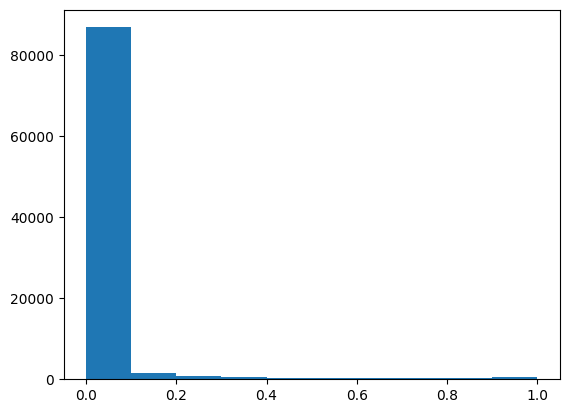

In [96]:
scs = [x[-1] for x in new_buffer]
import matplotlib.pyplot as plt

plt.hist(scs)

In [105]:
gamma = 0.99
n = 1 / (1-gamma)
print(n)
n = 5
gamma = 1-1/n
gamma

99.99999999999991


0.8

# Playground

In [101]:
m = torch.distributions.Categorical(torch.tensor([[ 0.25, 0.25, 0.25, 0.25 ], [ 0.25, 0.25, 0.25, 0.25 ]]))
m.sample()  # equal probability of 0, 1, 2, 3

tensor([1, 0])

In [204]:
rewards = [x[-1] for x in checked_buffer]
max(rewards)

0.94

In [3]:
import numpy as np
a = np.asarray([1,1,1])
a

array([1, 1, 1])

In [4]:
a[0], a

(1, array([1, 1, 1]))

In [7]:
a = np.concatenate((a, np.asarray([a[0]])))
a

array([1, 1, 1, 1])

In [8]:
import torch

In [54]:
a = torch.Tensor([[1, 12, 3], [4, 6, 2]])
c = torch.Tensor([[10, 2, 1/3], [40, 1/6, 5]])
a.shape, a, c

(torch.Size([2, 3]),
 tensor([[ 1., 12.,  3.],
         [ 4.,  6.,  2.]]),
 tensor([[10.0000,  2.0000,  0.3333],
         [40.0000,  0.1667,  5.0000]]))

In [55]:
torch.min(a,c)

tensor([[1.0000, 2.0000, 0.3333],
        [4.0000, 0.1667, 2.0000]])

In [35]:
values, idcs = torch.max(a, dim = -1)
values.shape, idcs.shape, values, idcs

(torch.Size([2]), torch.Size([2]), tensor([3., 6.]), tensor([2, 1]))

In [56]:
values, idcs = torch.max(torch.min(a,c), dim = 0)
values.shape, idcs.shape, values, idcs

(torch.Size([3]), torch.Size([3]), tensor([4., 2., 2.]), tensor([1, 0, 1]))

In [59]:
values, idcs = torch.max(torch.min(a,c), dim = -1)
values.shape, idcs.shape, values, idcs

(torch.Size([2]), torch.Size([2]), tensor([2., 4.]), tensor([1, 0]))

In [57]:
b = torch.Tensor([[1/6, 2/6, 3/6], [4/15, 6/15, 50/15]])
b.shape, b, idcs

(torch.Size([2, 3]),
 tensor([[0.1667, 0.3333, 0.5000],
         [0.2667, 0.4000, 3.3333]]),
 tensor([1, 0, 1]))

In [58]:
 prob = torch.gather(b.T, -1, idcs.unsqueeze(-1)).squeeze(-1)
prob.shape, prob

(torch.Size([3]), tensor([0.2667, 0.3333, 3.3333]))

In [20]:
idcs

tensor([2, 1])

In [46]:
import torch
num_layers = 3
obs_shape = 5
action_shape = 3
hidden_layer_size = 10
net_a = Net(layer_num=num_layers, 
            state_shape=obs_shape,
#             output_shape=action_shape,
            hidden_layer_size=hidden_layer_size).cuda()

actor = CategoricalPolicy(preprocess_net=net_a,
                        action_shape=action_shape,
                        hidden_layer_size=hidden_layer_size,
                        conditioned_sigma=False).cuda()
actor_optim = torch.optim.Adam(actor.parameters(), lr = 1e-4)

In [53]:
actor.preprocess.model[0].weight

Parameter containing:
tensor([[-0.0203, -0.1637, -0.0733, -0.3077, -0.1075],
        [ 0.1316, -0.2967,  0.1579, -0.3407, -0.2818],
        [ 0.1015, -0.1552,  0.4362, -0.2257,  0.2541],
        [-0.1202,  0.2176, -0.3277,  0.3584, -0.2431],
        [-0.4183,  0.1044, -0.3288,  0.3996, -0.0299],
        [-0.2938, -0.0897, -0.1094, -0.2011,  0.4318],
        [-0.3554,  0.4279, -0.2849,  0.2169,  0.0649],
        [ 0.2954, -0.1886,  0.1533,  0.0783, -0.3880],
        [-0.2560, -0.0590, -0.2636,  0.2904, -0.2199],
        [ 0.2930, -0.1439, -0.3382,  0.3880, -0.3795]], device='cuda:0',
       requires_grad=True)

In [56]:
actor.preprocess.model[0].weight.grad

tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000, -0.0003],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000, -0.0038],
        [ 0.0000,  0.0000,  0.0000,  0.0000, -0.0049],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000, -0.0002],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000]], device='cuda:0')

In [24]:
a = torch.Tensor([[1,1,1,1,1]]).cuda()
print(a.shape)
dist = actor(a)

torch.Size([1, 5])


In [30]:
a = torch.Tensor([0]).cuda()
a

tensor([0.], device='cuda:0')

In [32]:
torch.exp(dist.log_prob(a))

tensor([0.3343], device='cuda:0', grad_fn=<ExpBackward>)

In [28]:
m = [dist.sample() for _ in range(20)]

In [54]:
for epoch in range(100):
    print(epoch)
    for i in range(5):
        if i == 0:
            s = torch.Tensor([[1,0,0,0,0]]).cuda()
            a = torch.Tensor([0]).cuda()
        elif i == 0:
            s = torch.Tensor([[0,1,0,0,0]]).cuda()
            a = torch.Tensor([0]).cuda()
        elif i == 0:
            s = torch.Tensor([[0,0,1,0,0]]).cuda()
            a = torch.Tensor([1]).cuda()
        elif i == 0:
            s = torch.Tensor([[0,0,0,1,0]]).cuda()
            a = torch.Tensor([2]).cuda()
        elif i == 4:
            s = torch.Tensor([[0,0,0,0,1]]).cuda()
            a = torch.Tensor([2]).cuda()
        dist = actor(s)
        loss = - dist.log_prob(a).mean()
        actor_optim.zero_grad()
        loss.backward()
        actor_optim.step()
        print(loss.item())

0
1.1701910495758057
1.1700791120529175
1.1699668169021606
1.1698546409606934
1.1110988855361938
1
1.1696676015853882
1.1695857048034668
1.1694988012313843
1.169407844543457
1.1110813617706299
2
1.1692389249801636
1.169159173965454
1.1690753698349
1.1689881086349487
1.1110432147979736
3
1.1688228845596313
1.1687437295913696
1.1686608791351318
1.1685748100280762
1.110997200012207
4
1.1684110164642334
1.1683318614959717
1.1682493686676025
1.1681640148162842
1.1109484434127808
5
1.1680004596710205
1.1679213047027588
1.1678389310836792
1.1677536964416504
1.1108989715576172
6
1.1675900220870972
1.167510986328125
1.1674284934997559
1.1673431396484375
1.1108490228652954
7
1.1671794652938843
1.1671000719070435
1.1670175790786743
1.1669321060180664
1.1107990741729736
8
1.166767954826355
1.1666886806488037
1.1666057109832764
1.166520118713379
1.1107492446899414
9
1.166355848312378
1.166275978088379
1.1661930084228516
1.1661065816879272
1.110698938369751
10
1.165932297706604
1.1658467054367065
1.

1.1244581937789917
1.124363660812378
1.124265432357788
1.1241638660430908
1.1066126823425293
94
1.123968243598938
1.1238734722137451
1.1237746477127075
1.1236724853515625
1.106541395187378
95
1.123476266860962
1.1233808994293213
1.1232818365097046
1.1231791973114014
1.1064705848693848
96
1.122982144355774
1.1228864192962646
1.1227868795394897
1.1226837635040283
1.1064002513885498
97
1.122485876083374
1.1223896741867065
1.1222896575927734
1.1221860647201538
1.106330156326294
98
1.121987223625183
1.1218905448913574
1.1217900514602661
1.1216861009597778
1.1062605381011963
99
1.1214861869812012
1.1213891506195068
1.1212880611419678
1.1211836338043213
1.1061913967132568


In [45]:
actor.preprocess.model[6].weight.grad

tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0123,  0.0260,  0.0000,  0.0045,  0.0000,  0.0066,  0.0257,  0.0000,
          0.0175,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [-0.0019, -0.0040,  0.0000, -0.0007,  0.0000, -0.0010, -0.0040,  0.0000,
         -0.0027,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [-0.0016, -0.0035,  0.0000, -0.0006,  0.0000, -0.0009, -0.0034,  0.0000,
         -0.0023,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [-0.0060, -

In [41]:
actor.preprocess.model[0].weight.grad

tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0015],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000, -0.0004],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000, -0.0004],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000, -0.0004]], device='cuda:0')

In [35]:
s = torch.Tensor([[0,0,1,0,0]]).cuda()
dist = actor(s)
[dist.sample() for _ in range(20)]

[tensor([2], device='cuda:0'),
 tensor([1], device='cuda:0'),
 tensor([0], device='cuda:0'),
 tensor([0], device='cuda:0'),
 tensor([2], device='cuda:0'),
 tensor([0], device='cuda:0'),
 tensor([1], device='cuda:0'),
 tensor([1], device='cuda:0'),
 tensor([2], device='cuda:0'),
 tensor([2], device='cuda:0'),
 tensor([0], device='cuda:0'),
 tensor([0], device='cuda:0'),
 tensor([0], device='cuda:0'),
 tensor([1], device='cuda:0'),
 tensor([1], device='cuda:0'),
 tensor([0], device='cuda:0'),
 tensor([0], device='cuda:0'),
 tensor([1], device='cuda:0'),
 tensor([1], device='cuda:0'),
 tensor([2], device='cuda:0')]

In [138]:
import abc
import itertools
from torch import nn
from torch.nn import functional as F
from torch import optim

import numpy as np
import torch
from torch import distributions



class MLPPolicy(nn.Module, metaclass=abc.ABCMeta):

    def __init__(self,
                 ac_dim,
                 ob_dim,
                 n_layers,
                 size,
                 discrete=True,
                 learning_rate=1e-4,
                 training=True,
                 nn_baseline=False,
                 **kwargs
                 ):
        super().__init__(**kwargs)

        # init vars
        self.ac_dim = ac_dim
        self.ob_dim = ob_dim
        self.n_layers = n_layers
        self.discrete = discrete
        self.size = size
        self.learning_rate = learning_rate
        self.training = training
        self.nn_baseline = nn_baseline

        self.logits_na = build_mlp(input_size=self.ob_dim,
                                       output_size=self.ac_dim,
                                       n_layers=self.n_layers,
                                       size=self.size)
        self.logits_na.cuda()#to(ptu.device)
        self.mean_net = None
        self.logstd = None
        self.optimizer = optim.Adam(self.logits_na.parameters(),
                                    self.learning_rate)

#         if nn_baseline:
# #             self.baseline = ptu.build_mlp(
# #                 input_size=self.ob_dim,
# #                 output_size=1,
# #                 n_layers=self.n_layers,
# #                 size=self.size,
# #             )
# #             self.baseline.to(ptu.device)
# #             self.baseline_optimizer = optim.Adam(
# #                 self.baseline.parameters(),
# #                 self.learning_rate,
#             )
#         else:
        self.baseline = None

    ##################################

    def save(self, filepath):
        torch.save(self.state_dict(), filepath)

    ##################################

#     # query the policy with observation(s) to get selected action(s)
#     def get_action(self, obs: np.ndarray) -> np.ndarray:
#         if len(obs.shape) > 1:
#             observation = obs
#         else:
#             observation = obs[None]
#         observation = ptu.from_numpy(observation)
#         dist = self(observation)
#         if self.discrete:
#             d = dist.sample()
#         else:
#             d =  dist.rsample()
#         return d.detach().cpu().numpy()

#     # update/train this policy
#     def update(self, observations, actions, **kwargs):
        raise NotImplementedError

    def forward(self, observation: torch.FloatTensor):
        logits = self.logits_na(observation)
        action_distribution = distributions.Categorical(logits=logits)
        return action_distribution
from typing import Union

import torch
from torch import nn

Activation = Union[str, nn.Module]


_str_to_activation = {
    'relu': nn.ReLU(),
    'tanh': nn.Tanh(),
    'leaky_relu': nn.LeakyReLU(),
    'sigmoid': nn.Sigmoid(),
    'selu': nn.SELU(),
    'softplus': nn.Softplus(),
    'identity': nn.Identity(),
    'softmax':nn.Softmax()
}


def build_mlp(
        input_size: int,
        output_size: int,
        n_layers: int,
        size: int,
        activation: Activation = 'tanh',
        output_activation: Activation = 'identity',
) -> nn.Module:
    """
        Builds a feedforward neural network

        arguments:
            n_layers: number of hidden layers
            size: dimension of each hidden layer
            activation: activation of each hidden layer

            input_size: size of the input layer
            output_size: size of the output layer
            output_activation: activation of the output layer

        returns:
            MLP (nn.Module)
    """
    if isinstance(activation, str):
        activation = _str_to_activation[activation]
    if isinstance(output_activation, str):
        output_activation = _str_to_activation[output_activation]

    # TODO: return a MLP. This should be an instance of nn.Module
    # Note: nn.Sequential is an instance of nn.Module.
    # raise NotImplementedError
    model = []
    for layer in range(n_layers):
        if layer == 0:
            model.append(nn.Linear(input_size, size))
            model.append(activation)
        elif layer == n_layers - 1:
            model.append(nn.Linear(size, output_size))
            model.append(output_activation)
        else:
            model.append(nn.Linear(size, size))
            model.append(activation)
    return nn.Sequential(*model)



In [139]:
new_actor = MLPPolicy(4, 4, 5, 10)
#                  ac_dim,
#                  ob_dim,
#                  n_layers,
#                  size,
new_actor

MLPPolicy(
  (logits_na): Sequential(
    (0): Linear(in_features=4, out_features=10, bias=True)
    (1): Tanh()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): Tanh()
    (4): Linear(in_features=10, out_features=10, bias=True)
    (5): Tanh()
    (6): Linear(in_features=10, out_features=10, bias=True)
    (7): Tanh()
    (8): Linear(in_features=10, out_features=4, bias=True)
    (9): Identity()
  )
)

In [140]:
new_actor.logits_na[0].weight

Parameter containing:
tensor([[-0.1191,  0.2249, -0.1330,  0.0474],
        [ 0.3593,  0.1008, -0.4602, -0.1424],
        [-0.3898,  0.4335,  0.2431, -0.4206],
        [-0.0948,  0.4147,  0.3318,  0.3024],
        [ 0.1542,  0.4663, -0.3540,  0.0085],
        [ 0.0014, -0.2731,  0.1784,  0.2472],
        [ 0.1299,  0.0352,  0.2986, -0.1937],
        [ 0.4482, -0.1716,  0.1319, -0.2264],
        [-0.1079,  0.4338,  0.0284,  0.1420],
        [-0.2959, -0.1609, -0.2682,  0.0272]], device='cuda:0',
       requires_grad=True)

In [141]:
new_actor.logits_na[0].weight

Parameter containing:
tensor([[-0.1191,  0.2249, -0.1330,  0.0474],
        [ 0.3593,  0.1008, -0.4602, -0.1424],
        [-0.3898,  0.4335,  0.2431, -0.4206],
        [-0.0948,  0.4147,  0.3318,  0.3024],
        [ 0.1542,  0.4663, -0.3540,  0.0085],
        [ 0.0014, -0.2731,  0.1784,  0.2472],
        [ 0.1299,  0.0352,  0.2986, -0.1937],
        [ 0.4482, -0.1716,  0.1319, -0.2264],
        [-0.1079,  0.4338,  0.0284,  0.1420],
        [-0.2959, -0.1609, -0.2682,  0.0272]], device='cuda:0',
       requires_grad=True)

In [142]:
for epoch in range(1000):
    print(epoch)
    for i in range(4):
        if i == 0:
            s = torch.Tensor([[1,0,0,0]]).cuda()
            a = torch.Tensor([0]).cuda()
        elif i == 1:
            s = torch.Tensor([[0,1,0,0]]).cuda()
            a = torch.Tensor([1]).cuda()
        elif i == 2:
            s = torch.Tensor([[0,0,1,0]]).cuda()
            a = torch.Tensor([2]).cuda()
        elif i == 3:
            s = torch.Tensor([[0,0,0,1]]).cuda()
            a = torch.Tensor([3]).cuda()
#         elif i == 4:
#             s = torch.Tensor([[0,0,0,0,1]]).cuda()
#             a = torch.Tensor([2]).cuda()
        dist = new_actor(s)
        loss = - dist.log_prob(a).mean()
        new_actor.optimizer.zero_grad()
        loss.backward()
        new_actor.optimizer.step()
#         print(loss.item())

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [143]:
# s = torch.Tensor([[0,0,1,0,0]]).cuda()
# dist = new_actor(s)
# [dist.sample() for _ in range(20)]

In [144]:
s = torch.Tensor([[0,0,1,0]]).cuda()
dist = new_actor(s)
[dist.sample() for _ in range(20)]

[tensor([2], device='cuda:0'),
 tensor([2], device='cuda:0'),
 tensor([2], device='cuda:0'),
 tensor([1], device='cuda:0'),
 tensor([3], device='cuda:0'),
 tensor([3], device='cuda:0'),
 tensor([2], device='cuda:0'),
 tensor([2], device='cuda:0'),
 tensor([3], device='cuda:0'),
 tensor([2], device='cuda:0'),
 tensor([2], device='cuda:0'),
 tensor([2], device='cuda:0'),
 tensor([2], device='cuda:0'),
 tensor([2], device='cuda:0'),
 tensor([2], device='cuda:0'),
 tensor([2], device='cuda:0'),
 tensor([2], device='cuda:0'),
 tensor([2], device='cuda:0'),
 tensor([2], device='cuda:0'),
 tensor([1], device='cuda:0')]

In [145]:
s = torch.Tensor([[1,0,0,0]]).cuda()
dist = new_actor(s)
test = [torch.Tensor([0]).cuda(), torch.Tensor([1]).cuda(), torch.Tensor([2]).cuda(),torch.Tensor([3]).cuda()]
for a in test:
    print(a, torch.exp(dist.log_prob(a)))
# [dist.sample() for _ in range(20)]

tensor([0.], device='cuda:0') tensor([0.8842], device='cuda:0', grad_fn=<ExpBackward>)
tensor([1.], device='cuda:0') tensor([0.0418], device='cuda:0', grad_fn=<ExpBackward>)
tensor([2.], device='cuda:0') tensor([0.0136], device='cuda:0', grad_fn=<ExpBackward>)
tensor([3.], device='cuda:0') tensor([0.0603], device='cuda:0', grad_fn=<ExpBackward>)


In [146]:
s = torch.Tensor([[0,1,0,0]]).cuda()
dist = new_actor(s)
test = [torch.Tensor([0]).cuda(), torch.Tensor([1]).cuda(), torch.Tensor([2]).cuda(),torch.Tensor([3]).cuda()]
for a in test:
    print(a, torch.exp(dist.log_prob(a)))

tensor([0.], device='cuda:0') tensor([0.0525], device='cuda:0', grad_fn=<ExpBackward>)
tensor([1.], device='cuda:0') tensor([0.7932], device='cuda:0', grad_fn=<ExpBackward>)
tensor([2.], device='cuda:0') tensor([0.0959], device='cuda:0', grad_fn=<ExpBackward>)
tensor([3.], device='cuda:0') tensor([0.0584], device='cuda:0', grad_fn=<ExpBackward>)


In [147]:
s = torch.Tensor([[0,0,1,0]]).cuda()
dist = new_actor(s)
test = [torch.Tensor([0]).cuda(), torch.Tensor([1]).cuda(), torch.Tensor([2]).cuda(),torch.Tensor([3]).cuda()]
for a in test:
    print(a, torch.exp(dist.log_prob(a)))

tensor([0.], device='cuda:0') tensor([0.0229], device='cuda:0', grad_fn=<ExpBackward>)
tensor([1.], device='cuda:0') tensor([0.1519], device='cuda:0', grad_fn=<ExpBackward>)
tensor([2.], device='cuda:0') tensor([0.6785], device='cuda:0', grad_fn=<ExpBackward>)
tensor([3.], device='cuda:0') tensor([0.1467], device='cuda:0', grad_fn=<ExpBackward>)


In [148]:
s = torch.Tensor([[0,0,0,1]]).cuda()
dist = new_actor(s)
test = [torch.Tensor([0]).cuda(), torch.Tensor([1]).cuda(), torch.Tensor([2]).cuda(),torch.Tensor([3]).cuda()]
for a in test:
    print(a, torch.exp(dist.log_prob(a)))

tensor([0.], device='cuda:0') tensor([0.0994], device='cuda:0', grad_fn=<ExpBackward>)
tensor([1.], device='cuda:0') tensor([0.0762], device='cuda:0', grad_fn=<ExpBackward>)
tensor([2.], device='cuda:0') tensor([0.1176], device='cuda:0', grad_fn=<ExpBackward>)
tensor([3.], device='cuda:0') tensor([0.7068], device='cuda:0', grad_fn=<ExpBackward>)


In [149]:
s = torch.Tensor([[0,0,0,0]]).cuda()
dist = new_actor(s)
test = [torch.Tensor([0]).cuda(), torch.Tensor([1]).cuda(), torch.Tensor([2]).cuda(),torch.Tensor([3]).cuda()]
for a in test:
    print(a, torch.exp(dist.log_prob(a)))

tensor([0.], device='cuda:0') tensor([0.3553], device='cuda:0', grad_fn=<ExpBackward>)
tensor([1.], device='cuda:0') tensor([0.2295], device='cuda:0', grad_fn=<ExpBackward>)
tensor([2.], device='cuda:0') tensor([0.1312], device='cuda:0', grad_fn=<ExpBackward>)
tensor([3.], device='cuda:0') tensor([0.2840], device='cuda:0', grad_fn=<ExpBackward>)


In [150]:
s = torch.Tensor([[1,1,0,0]]).cuda()
dist = new_actor(s)
test = [torch.Tensor([0]).cuda(), torch.Tensor([1]).cuda(), torch.Tensor([2]).cuda(),torch.Tensor([3]).cuda()]
for a in test:
    print(a, torch.exp(dist.log_prob(a)))

tensor([0.], device='cuda:0') tensor([0.5747], device='cuda:0', grad_fn=<ExpBackward>)
tensor([1.], device='cuda:0') tensor([0.3178], device='cuda:0', grad_fn=<ExpBackward>)
tensor([2.], device='cuda:0') tensor([0.0443], device='cuda:0', grad_fn=<ExpBackward>)
tensor([3.], device='cuda:0') tensor([0.0632], device='cuda:0', grad_fn=<ExpBackward>)


In [114]:
test = {}
test[("dog", 10)] = 5
test

{('dog', 10): 5}

In [115]:
("dog", 10) in test

True

In [117]:
test = [(1,1), (2,2)]
for x, y in test:
    print(x)

1
2


In [164]:
good_idx = [6, 7]
bad_idx = [1,2,3,4]
good_idx.extend(np.random.choice(bad_idx,len(bad_idx)//2,replace=False))
good_idx.sort()

In [165]:
good_idx

[1, 2, 6, 7]